In [167]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler

In [168]:
cols = ["fLength", "fWidth", "fSize", "fConc", "fConc1", "fAsym", "fM3Long", "fM3Trans", "fAlpha", "fDist", "class"]
df = pd.read_csv("C:/ML/magic04.data", names=cols)
df.head()

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,g
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,g
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,g
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,g
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,g


In [169]:
df['class'] = df['class'].replace({"g":1, "h":0})

In [170]:
df.head()

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,1
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,1
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,1
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,1
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,1


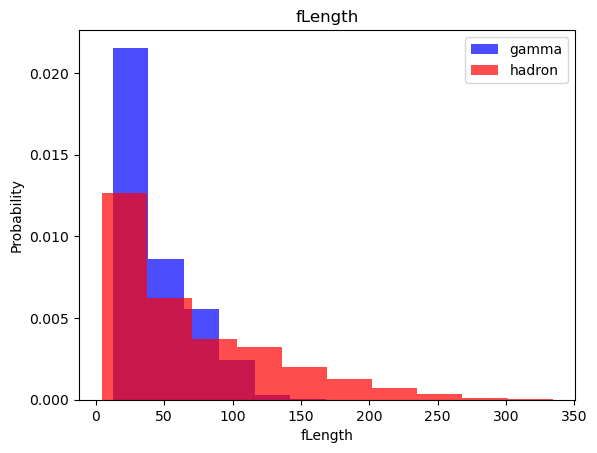

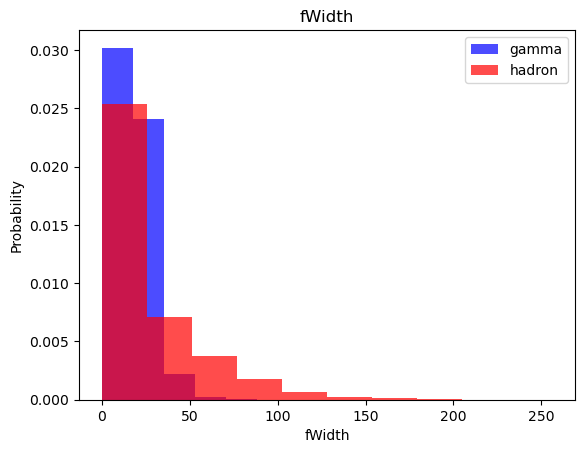

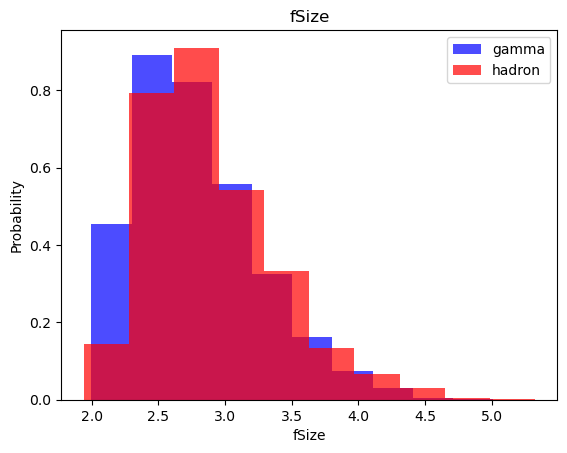

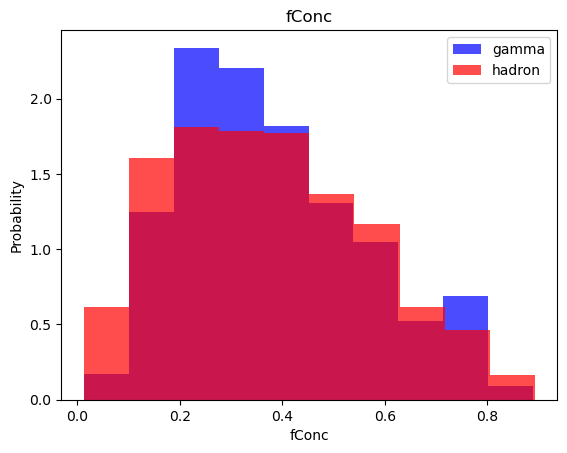

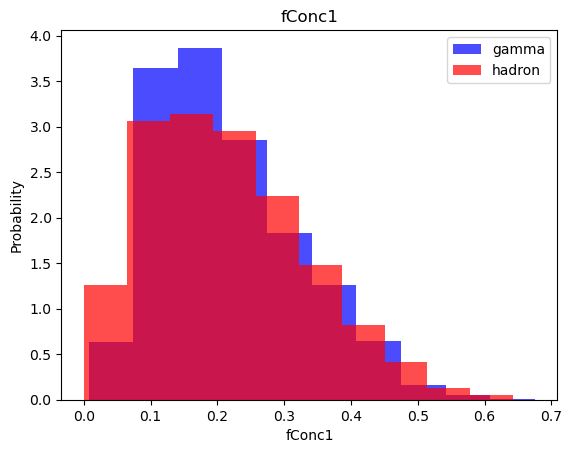

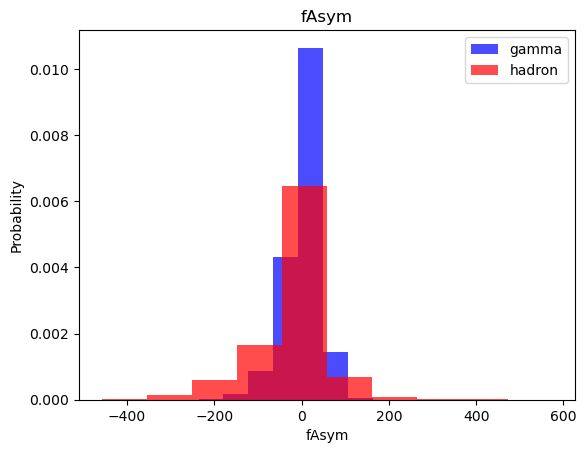

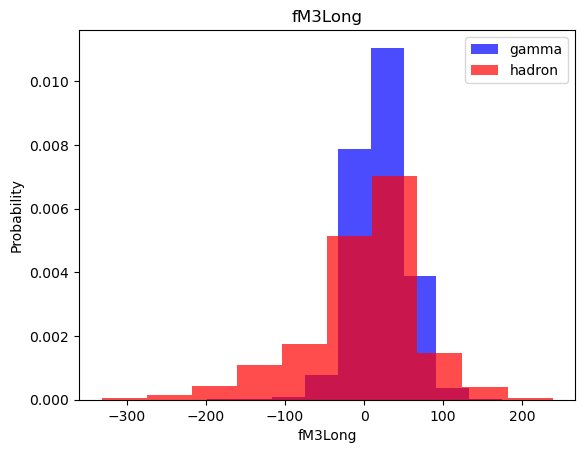

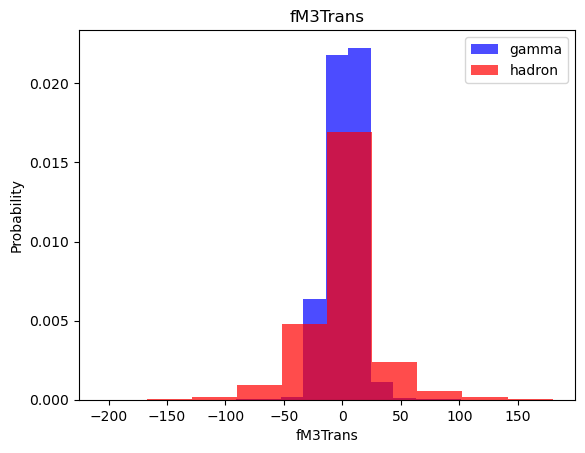

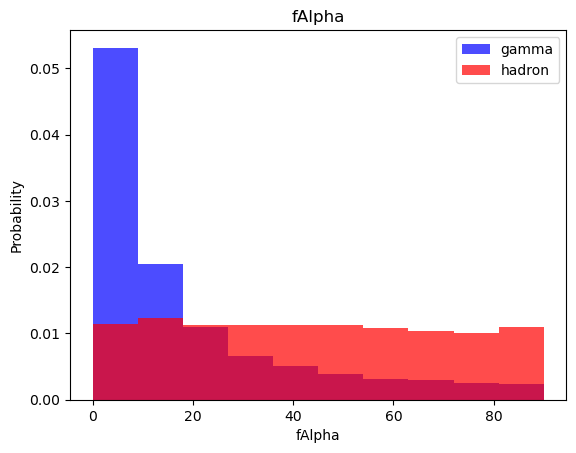

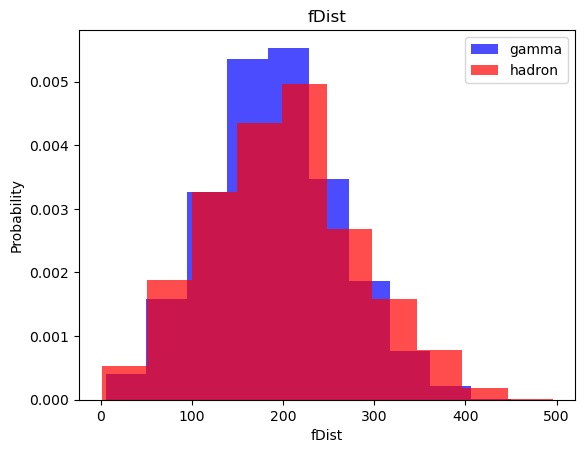

In [171]:
for label in cols[:-1]:
    plt.hist(df[df['class'] == 1][label], color='blue', label='gamma', alpha=0.7, density=True)
    plt.hist(df[df['class'] == 0][label], color='red', label='hadron', alpha=0.7, density=True)
    plt.title(label)
    plt.ylabel("Probability")
    plt.xlabel(label)
    plt.legend()
    plt.show()

In [172]:
train, valid, test = np.split(df.sample(frac=1), [int(0.6 * len(df)), int(0.8 * len(df))])

c:\Users\hamza\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


In [173]:
train

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
4922,43.0126,15.2872,2.6968,0.3136,0.1578,56.8591,25.3144,15.3148,2.4997,222.9330,1
10261,23.7571,16.8651,2.7860,0.4190,0.2250,-1.8632,18.4646,7.8791,14.9592,132.2330,1
10725,13.1598,10.4453,2.1414,0.7870,0.4874,13.1831,5.6563,-10.5963,34.5856,179.0960,1
10442,82.4473,35.7308,2.9204,0.3195,0.1988,-15.1066,-61.9555,35.4822,7.6504,326.6580,1
6832,39.4622,4.6474,2.3784,0.6234,0.4038,18.6142,29.3952,3.4627,14.0060,166.7310,1
...,...,...,...,...,...,...,...,...,...,...,...
7168,46.8799,25.7640,2.6101,0.3117,0.1779,24.4241,41.2339,-13.5582,10.0863,267.4400,1
11853,24.7191,15.3082,2.7380,0.4077,0.2057,13.0371,12.3450,8.9074,64.5648,41.7459,1
8769,101.0460,25.2519,3.0752,0.3078,0.1653,-44.5542,38.2132,-23.3593,0.4197,336.1860,1
10234,40.7123,23.1087,3.0374,0.2734,0.1803,24.9550,27.1432,16.2558,16.5465,130.2890,1


In [174]:
test

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
1427,68.9088,26.5542,3.3161,0.1657,0.0867,56.9762,57.0510,11.8513,0.7358,266.3100,1
5896,27.1759,12.5123,2.6735,0.4539,0.2492,28.5548,19.0803,7.9904,15.7370,160.3850,1
11798,62.2195,24.2531,3.2907,0.1772,0.0991,9.7232,43.2756,-11.0521,1.5585,247.3740,1
14164,130.4403,79.1401,3.3709,0.1536,0.0561,147.4104,-111.5511,-89.7430,37.5126,163.4359,0
14234,68.1675,17.6491,2.6488,0.4198,0.2144,-13.0659,-73.8798,12.2847,27.8760,178.3910,0
...,...,...,...,...,...,...,...,...,...,...,...
6918,87.0114,34.6213,3.3763,0.2392,0.1310,5.6917,-44.6859,-20.4095,1.7760,343.1400,1
18545,21.9832,18.5640,2.7474,0.4024,0.2368,27.0198,21.9590,9.3895,88.5075,90.0599,0
18341,98.5681,37.7214,3.2964,0.1440,0.0720,23.0117,113.5180,23.9109,34.0820,281.2750,0
16717,17.3517,16.8760,2.4965,0.4064,0.2277,-0.8085,16.4074,6.3584,32.4333,145.3753,0


In [175]:
valid

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
10860,29.4658,19.6390,2.9934,0.3503,0.1873,-4.3524,17.6604,-2.6286,0.2353,211.7190,1
15978,69.6536,32.8110,3.1655,0.1858,0.1042,-81.4523,-54.0003,-25.4955,4.4200,247.9710,0
12001,18.4648,16.1461,2.3901,0.4888,0.2790,19.5164,18.5118,-5.8176,25.2990,224.6990,1
4137,19.1694,12.4757,2.3829,0.5466,0.3002,1.9239,-11.7821,-8.5164,6.4218,180.4820,1
7164,52.8214,16.7597,2.7828,0.3001,0.1690,21.8277,30.9728,4.2133,14.8340,186.7230,1
...,...,...,...,...,...,...,...,...,...,...,...
18226,49.6784,5.1439,2.9357,0.4163,0.2329,33.3423,36.6091,-0.9971,7.2500,157.3256,0
14499,27.4363,6.9876,2.1818,0.5724,0.3257,-11.7396,-11.8573,3.8028,63.7379,221.8210,0
15027,27.2364,7.4120,2.7131,0.5088,0.3090,-9.3461,-3.8343,4.7101,61.1569,108.6919,0
4330,80.3703,33.2511,3.2877,0.1258,0.0688,1.8239,69.4048,-19.2851,21.8410,221.0830,1


In [176]:
def scale_dataset(dataframe, oversample=False):
    X = dataframe[dataframe.columns[:-1]].values
    y = dataframe[dataframe.columns[-1]].values
    scaler = StandardScaler()
    X = scaler.fit_transform(X)
    if oversample:
        ros = RandomOverSampler()
        X, y = ros.fit_resample(X, y)
    data = np.hstack((X, np.reshape(y, (-1, 1))))
    return data, X, y

In [177]:
print(len(train[train['class'] == 1])) # gamma
print(len(train[train['class'] == 0])) # hadron

7401
4011


In [178]:
train, X_train, y_train = scale_dataset(train, oversample=True)
valid, X_valid, y_valid = scale_dataset(valid, oversample=False)
test, X_test, y_test = scale_dataset(test, oversample=False)

In [179]:
print(sum(y_train == 1)) # Gamma
print(sum(y_train == 0)) # Hadron

7401
7401


# KNN => K-nearest neighbor

In [180]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

In [181]:
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train, y_train)

KNeighborsClassifier()

In [182]:
y_predicted = knn_model.predict(X_test)
y_predicted

array([1, 1, 1, ..., 0, 1, 0], dtype=int64)

In [183]:
y_test

array([1, 1, 1, ..., 0, 0, 1], dtype=int64)

In [184]:
print(classification_report(y_test, y_predicted))

              precision    recall  f1-score   support

           0       0.76      0.73      0.74      1329
           1       0.86      0.88      0.87      2475

    accuracy                           0.82      3804
   macro avg       0.81      0.80      0.80      3804
weighted avg       0.82      0.82      0.82      3804



# Naive Bayes

In [185]:
from sklearn.naive_bayes import GaussianNB

In [186]:
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)

GaussianNB()

In [187]:
nb_model.predict(X_test)

array([1, 1, 1, ..., 0, 1, 1], dtype=int64)

In [188]:
nb_model.score(X_test, y_test)

0.7192429022082019

In [189]:
y_pred = nb_model.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.67      0.39      0.50      1329
           1       0.73      0.89      0.81      2475

    accuracy                           0.72      3804
   macro avg       0.70      0.64      0.65      3804
weighted avg       0.71      0.72      0.70      3804



# Logistic Regression

In [190]:
from sklearn.linear_model import LogisticRegression

In [191]:
lg_model = LogisticRegression()

In [192]:
lg_model.fit(X_train, y_train)

LogisticRegression()

In [193]:
lg_model.predict(X_test)

array([1, 1, 1, ..., 0, 1, 0], dtype=int64)

In [194]:
print(classification_report(y_test, lg_model.predict(X_test)))

              precision    recall  f1-score   support

           0       0.68      0.72      0.70      1329
           1       0.85      0.82      0.83      2475

    accuracy                           0.78      3804
   macro avg       0.76      0.77      0.77      3804
weighted avg       0.79      0.78      0.79      3804



# Detecting Outliers

In [195]:
print("The number of outliers in each column")
for label in df.columns[:-1]:
    Q1 = df[label].quantile(0.25)
    Q3 = df[label].quantile(0.75)
    IQR = Q3 - Q1
    print(label + ": ", end='')
    print(df.loc[(df[label] > Q3 + 1.5*IQR) | (df[label] < Q1 - 1.5*IQR), label].shape[0])


The number of outliers in each column
fLength: 971
fWidth: 1546
fSize: 367
fConc: 0
fConc1: 150
fAsym: 1781
fM3Long: 1218
fM3Trans: 850
fAlpha: 0
fDist: 128


# Support Vector Machine (SVM)

In [196]:
from sklearn.svm import SVC # Support Vector Classifier 

In [197]:
svm_model = SVC()

In [198]:
svm_model.fit(X_train, y_train)

SVC()

In [199]:
svm_model.score(X_test, y_test)

0.8590956887486856

In [200]:
print(classification_report(y_test, svm_model.predict(X_test)))

              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1329
           1       0.89      0.89      0.89      2475

    accuracy                           0.86      3804
   macro avg       0.85      0.85      0.85      3804
weighted avg       0.86      0.86      0.86      3804



# Neural Networks

In [201]:
import tensorflow as tf

In [202]:
nn_model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation='relu', input_shape=(10,)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')

])
nn_model.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss='binary_crossentropy', metrics=['accuracy'])

c:\Users\hamza\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [203]:
def plot_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))
    ax1.plot(history.history['loss'], label='loss')
    ax1.plot(history.history['val_loss'], label='val_loss')
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Binary CrossEntropy")
    ax1.legend()
    ax1.grid(True)
    ax2.plot(history.history['accuracy'], label='accuracy')
    ax2.plot(history.history['val_accuracy'], label='val_accuracy')
    ax2.set_xlabel("Epoch")
    ax2.set_ylabel("Accuracy")
    ax2.legend()
    plt.grid(True)
    plt.show()

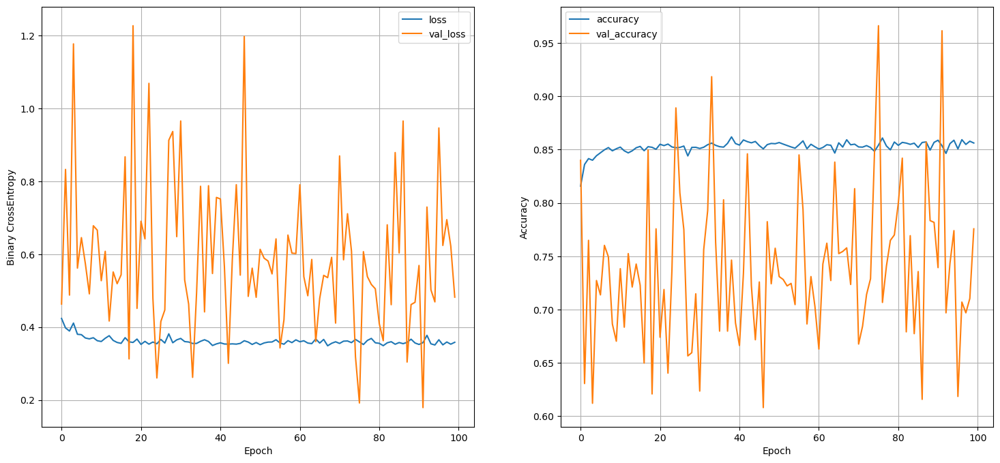

In [204]:
plot_history(history)

In [205]:
nn_model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation='relu', input_shape=(10,)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')

])
nn_model.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss='binary_crossentropy', metrics=['accuracy'])

In [212]:
history = nn_model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=32,
    validation_split=0.2,
)

Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8895 - loss: 0.2679 - val_accuracy: 0.8186 - val_loss: 0.3579
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8890 - loss: 0.2697 - val_accuracy: 0.8136 - val_loss: 0.3745
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8910 - loss: 0.2691 - val_accuracy: 0.7923 - val_loss: 0.4072
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.8870 - loss: 0.2705 - val_accuracy: 0.7886 - val_loss: 0.4155
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8861 - loss: 0.2644 - val_accuracy: 0.8011 - val_loss: 0.4005
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8889 - loss: 0.2641 - val_accuracy: 0.8051 - val_loss: 0.3949
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8857 - loss: 0.2664 - val_accuracy: 0.8055 - val_loss: 0.3878
Epoch 8/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8926 - loss: 0.2646 - val_accu

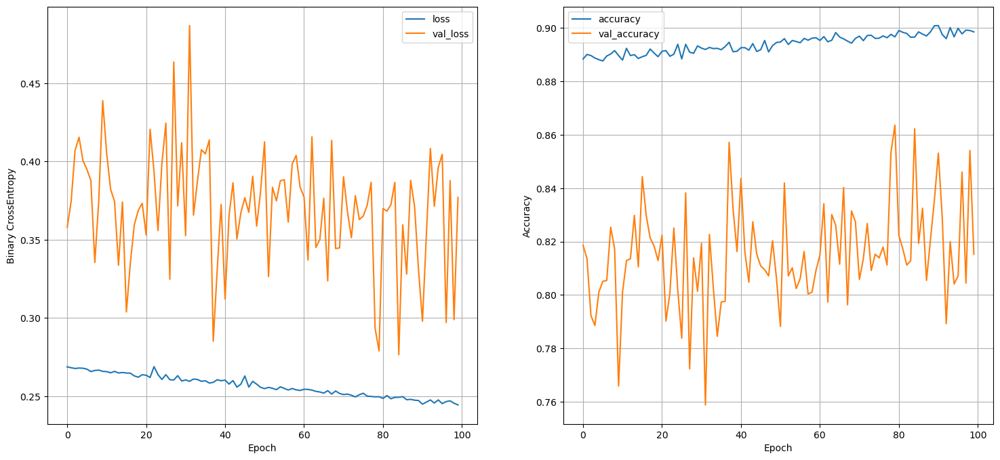

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8654 - loss: 0.3533
[0.3437851369380951, 0.8688222765922546]
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8654 - loss: 0.3533
0.3437851369380951


In [216]:
plot_history(history)
print(nn_model.evaluate(X_valid, y_valid))
print(nn_model.evaluate(X_valid, y_valid)[0])

In [208]:
print(history.history['accuracy'][-1])
print(history.history['loss'][-1])

0.8881006836891174
0.2680549621582031


In [209]:
def train_model(X_train, y_train, num_nodes, dropout_prob, lr, batch_size, epochs):
    nn_model = tf.keras.Sequential([
        tf.keras.layers.Dense(num_nodes, activation='relu', input_shape=(10,)),
        tf.keras.layers.Dropout(dropout_prob),
        tf.keras.layers.Dense(num_nodes, activation='relu'),
        tf.keras.layers.Dropout(dropout_prob),
        tf.keras.layers.Dense(1, activation='sigmoid')

    ])
    nn_model.compile(optimizer=tf.keras.optimizers.Adam(lr), loss='binary_crossentropy', metrics=['accuracy'])
    history = nn_model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2)
    return nn_model, history 

16 nodes 0 dropout 0.1 learning rate 32 batch size
Epoch 1/100


c:\Users\hamza\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7902 - loss: 0.4580 - val_accuracy: 0.8707 - val_loss: 0.3315
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8238 - loss: 0.4126 - val_accuracy: 0.6883 - val_loss: 0.6718
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8373 - loss: 0.3841 - val_accuracy: 0.6471 - val_loss: 0.4277
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8387 - loss: 0.3942 - val_accuracy: 0.6535 - val_loss: 0.6430
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8439 - loss: 0.3650 - val_accuracy: 0.8001 - val_loss: 0.3651
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8472 - loss: 0.3685 - val_accuracy: 0.7649 - val_loss: 0.4273
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8458 - loss: 0.3682 - val_accuracy: 0.7636 - val_loss: 0.4007
Epoch 8/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8487 - loss: 0.3630 - val_accuracy: 0.7602

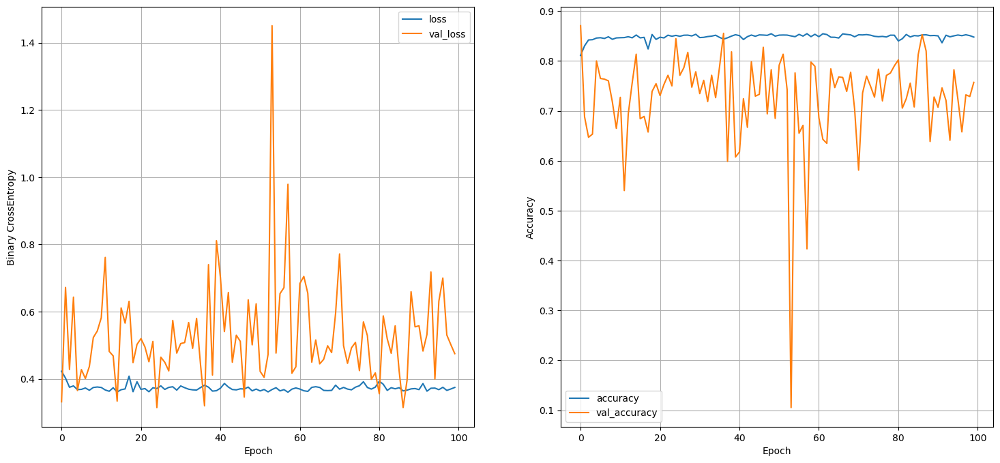

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8551 - loss: 0.3541
16 nodes 0 dropout 0.1 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.7908 - loss: 0.4596 - val_accuracy: 0.6856 - val_loss: 0.4984
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8294 - loss: 0.3972 - val_accuracy: 0.7197 - val_loss: 0.5519
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8488 - loss: 0.3572 - val_accuracy: 0.7045 - val_loss: 0.6125
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8459 - loss: 0.3639 - val_accuracy: 0.6863 - val_loss: 0.6847
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8477 - loss: 0.3670 - val_accuracy: 0.6103 - val_loss: 0.4356
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8394 - loss: 0.3834 - val_accuracy: 0.7923 - val_loss: 0.4521
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8427 - loss: 0.3721 - val_accurac

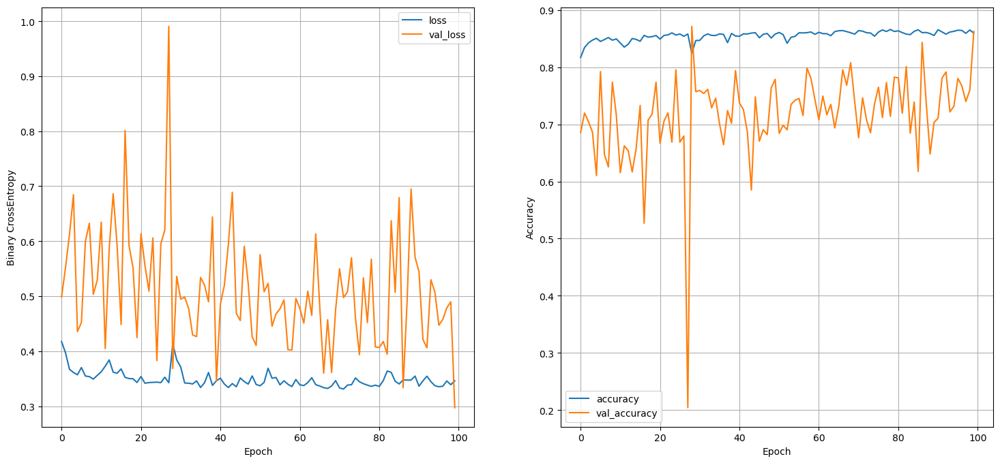

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8389 - loss: 0.3883
16 nodes 0 dropout 0.1 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7809 - loss: 0.4581 - val_accuracy: 0.6444 - val_loss: 0.6460
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8472 - loss: 0.3674 - val_accuracy: 0.7487 - val_loss: 0.4355
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8549 - loss: 0.3501 - val_accuracy: 0.7808 - val_loss: 0.4599
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8615 - loss: 0.3411 - val_accuracy: 0.7251 - val_loss: 0.4350
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8561 - loss: 0.3383 - val_accuracy: 0.7383 - val_loss: 0.4814
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8543 - loss: 0.3480 - val_accuracy: 0.6957 - val_loss: 0.4847
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8477 - loss: 0.3418 - val_accuracy: 0.7751 - v

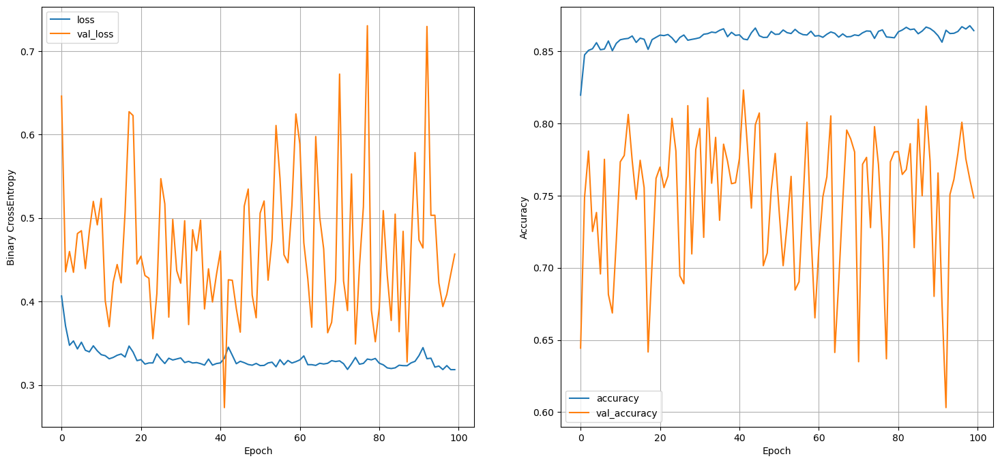

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - accuracy: 0.8631 - loss: 0.3180
16 nodes 0 dropout 0.005 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7536 - loss: 0.4895 - val_accuracy: 0.7376 - val_loss: 0.4895
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8410 - loss: 0.3708 - val_accuracy: 0.7383 - val_loss: 0.4996
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8501 - loss: 0.3463 - val_accuracy: 0.7251 - val_loss: 0.5348
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8595 - loss: 0.3356 - val_accuracy: 0.7741 - val_loss: 0.4197
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8656 - loss: 0.3255 - val_accuracy: 0.7447 - val_loss: 0.4901
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8630 - loss: 0.3198 - val_accuracy: 0.7025 - val_loss: 0.5622
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8584 - loss: 0.3349 - val_acc

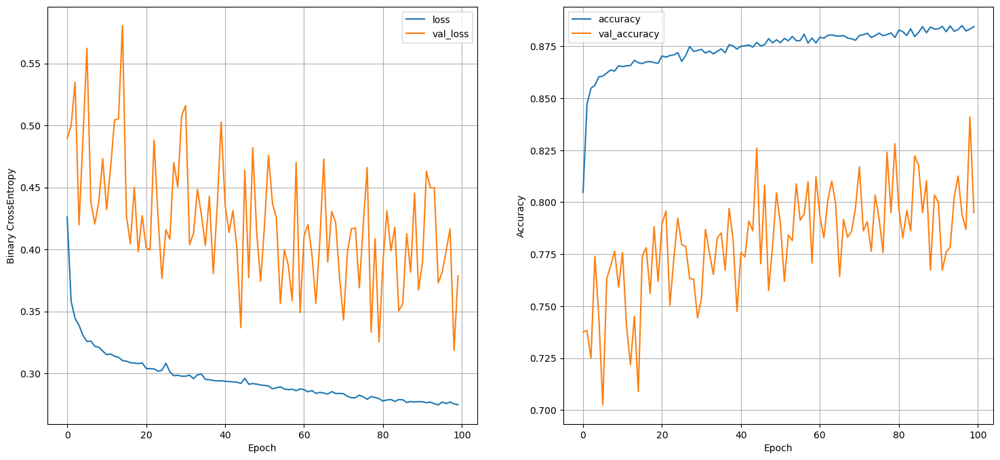

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8777 - loss: 0.3085
16 nodes 0 dropout 0.005 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7422 - loss: 0.5274 - val_accuracy: 0.6272 - val_loss: 0.6355
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8336 - loss: 0.3845 - val_accuracy: 0.7575 - val_loss: 0.4940
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8547 - loss: 0.3461 - val_accuracy: 0.7663 - val_loss: 0.4935
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8554 - loss: 0.3401 - val_accuracy: 0.7322 - val_loss: 0.5330
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8579 - loss: 0.3389 - val_accuracy: 0.7349 - val_loss: 0.5359
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8627 - loss: 0.3238 - val_accuracy: 0.7568 - val_loss: 0.4871
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8635 - loss: 0.3175 - val_accur

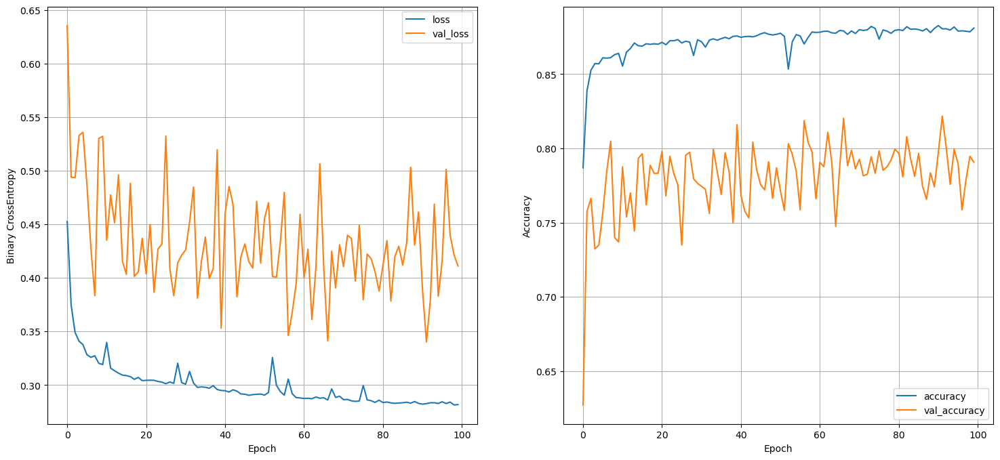

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8779 - loss: 0.3177
16 nodes 0 dropout 0.005 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6912 - loss: 0.5857 - val_accuracy: 0.7065 - val_loss: 0.5241
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8266 - loss: 0.3895 - val_accuracy: 0.7494 - val_loss: 0.4763
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8423 - loss: 0.3683 - val_accuracy: 0.7676 - val_loss: 0.4643
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8542 - loss: 0.3473 - val_accuracy: 0.7703 - val_loss: 0.4445
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8522 - loss: 0.3486 - val_accuracy: 0.7622 - val_loss: 0.4516
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8586 - loss: 0.3324 - val_accuracy: 0.7619 - val_loss: 0.4604
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8608 - loss: 0.3234 - val_accuracy: 0.7541 -

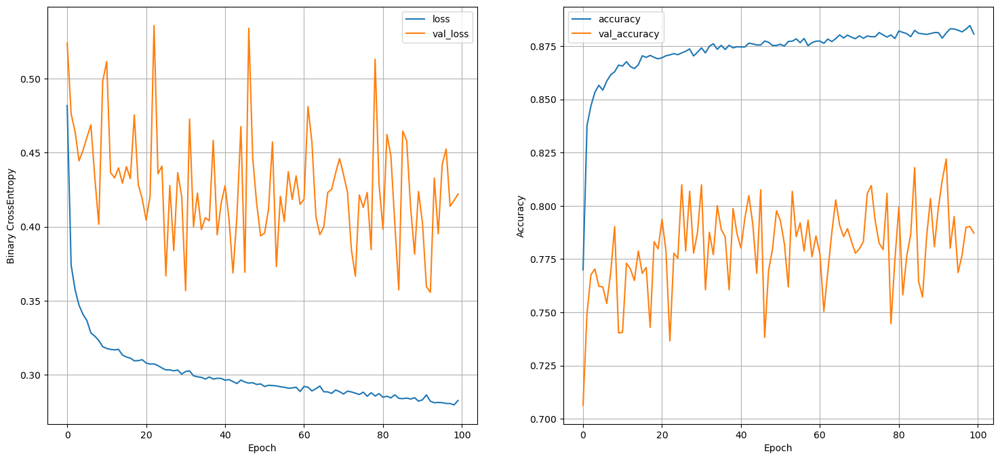

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8715 - loss: 0.3331
16 nodes 0 dropout 0.001 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.6849 - loss: 0.6047 - val_accuracy: 0.6714 - val_loss: 0.5910
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8165 - loss: 0.4016 - val_accuracy: 0.6599 - val_loss: 0.5809
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8314 - loss: 0.3827 - val_accuracy: 0.7146 - val_loss: 0.5256
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8397 - loss: 0.3700 - val_accuracy: 0.7592 - val_loss: 0.4724
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8506 - loss: 0.3491 - val_accuracy: 0.7362 - val_loss: 0.5053
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8440 - loss: 0.3561 - val_accuracy: 0.7869 - val_loss: 0.4324
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8550 - loss: 0.3419 - val_accur

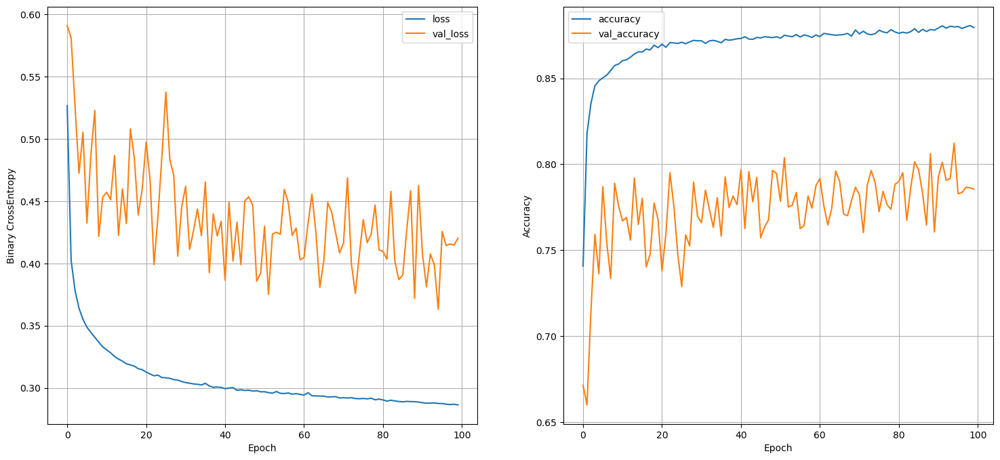

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8718 - loss: 0.3095
16 nodes 0 dropout 0.001 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6747 - loss: 0.6239 - val_accuracy: 0.6045 - val_loss: 0.6905
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8018 - loss: 0.4372 - val_accuracy: 0.6998 - val_loss: 0.5582
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8308 - loss: 0.3868 - val_accuracy: 0.7251 - val_loss: 0.5222
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8324 - loss: 0.3817 - val_accuracy: 0.7224 - val_loss: 0.5330
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8470 - loss: 0.3608 - val_accuracy: 0.7582 - val_loss: 0.4799
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8505 - loss: 0.3501 - val_accuracy: 0.7535 - val_loss: 0.4826
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8451 - loss: 0.3539 - val_accur

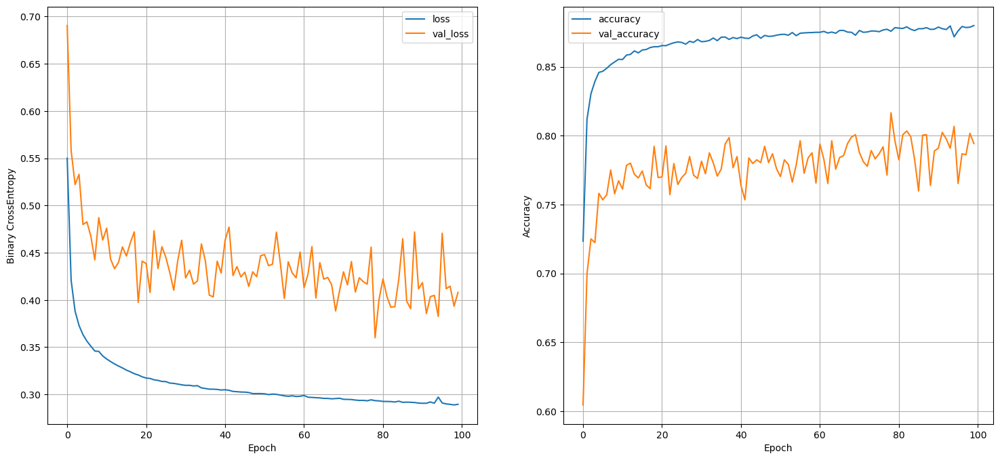

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8746 - loss: 0.3072
16 nodes 0 dropout 0.001 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.5211 - loss: 0.6824 - val_accuracy: 0.5576 - val_loss: 0.6007
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7767 - loss: 0.5197 - val_accuracy: 0.5883 - val_loss: 0.6423
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7990 - loss: 0.4361 - val_accuracy: 0.6501 - val_loss: 0.5718
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8131 - loss: 0.4122 - val_accuracy: 0.6440 - val_loss: 0.5908
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8237 - loss: 0.4031 - val_accuracy: 0.6775 - val_loss: 0.5581
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8331 - loss: 0.3813 - val_accuracy: 0.7048 - val_loss: 0.5285
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8366 - loss: 0.3781 - val_accuracy: 0.7264 -

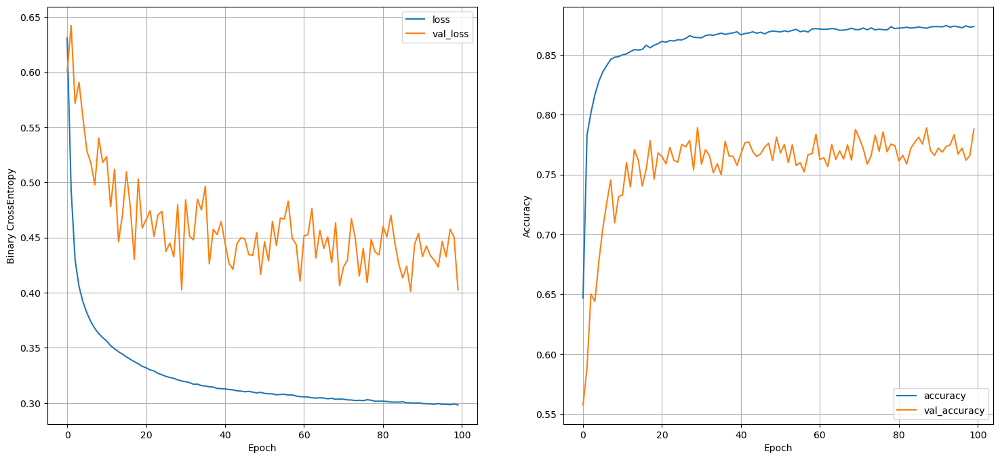

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - accuracy: 0.8768 - loss: 0.3066
16 nodes 0.2 dropout 0.1 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7400 - loss: 0.5395 - val_accuracy: 0.3337 - val_loss: 0.7326
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7337 - loss: 0.5280 - val_accuracy: 0.4607 - val_loss: 0.8713
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7592 - loss: 0.5017 - val_accuracy: 0.4843 - val_loss: 0.7931
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7474 - loss: 0.5026 - val_accuracy: 0.3759 - val_loss: 0.8503
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7520 - loss: 0.5452 - val_accuracy: 0.4772 - val_loss: 0.7355
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7784 - loss: 0.4955 - val_accuracy: 0.6778 - val_loss: 0.4735
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7920 - loss: 0.5043 - val_acc

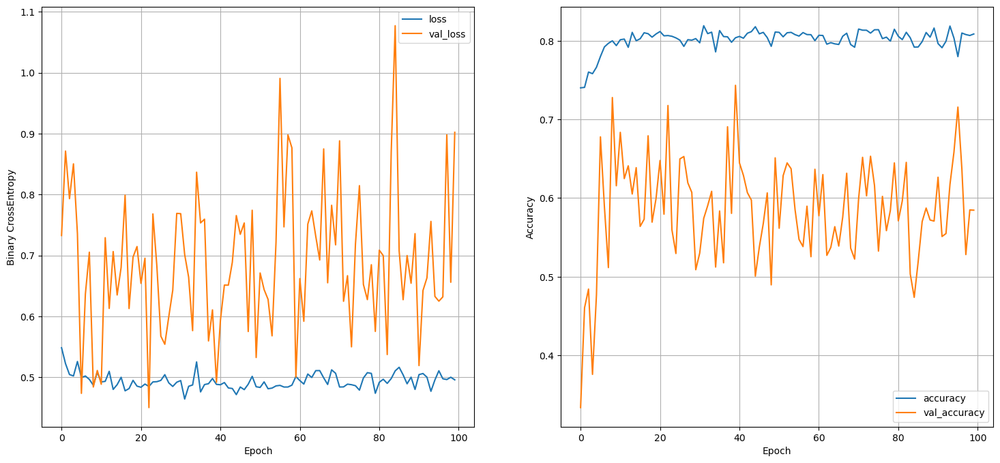

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8416 - loss: 0.4864
16 nodes 0.2 dropout 0.1 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7542 - loss: 0.5136 - val_accuracy: 0.4333 - val_loss: 0.7064
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7821 - loss: 0.4712 - val_accuracy: 0.6795 - val_loss: 0.6227
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7984 - loss: 0.4509 - val_accuracy: 0.6579 - val_loss: 0.5091
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7902 - loss: 0.4675 - val_accuracy: 0.5694 - val_loss: 0.7727
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8109 - loss: 0.4304 - val_accuracy: 0.7190 - val_loss: 0.4316
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8162 - loss: 0.4252 - val_accuracy: 0.4900 - val_loss: 0.6782
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7699 - loss: 0.4875 - val_accur

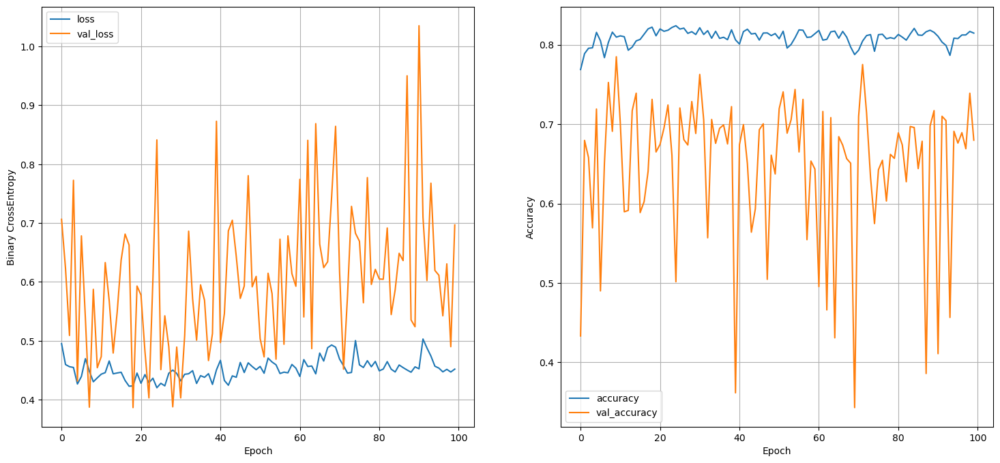

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8441 - loss: 0.4001
16 nodes 0.2 dropout 0.1 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7476 - loss: 0.5126 - val_accuracy: 0.5866 - val_loss: 0.5954
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8112 - loss: 0.4346 - val_accuracy: 0.6136 - val_loss: 0.5797
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8103 - loss: 0.4278 - val_accuracy: 0.7572 - val_loss: 0.4646
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8142 - loss: 0.4353 - val_accuracy: 0.7693 - val_loss: 0.3995
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8204 - loss: 0.4110 - val_accuracy: 0.7342 - val_loss: 0.4482
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8312 - loss: 0.3998 - val_accuracy: 0.6599 - val_loss: 0.5602
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8194 - loss: 0.4083 - val_accuracy: 0.6575 -

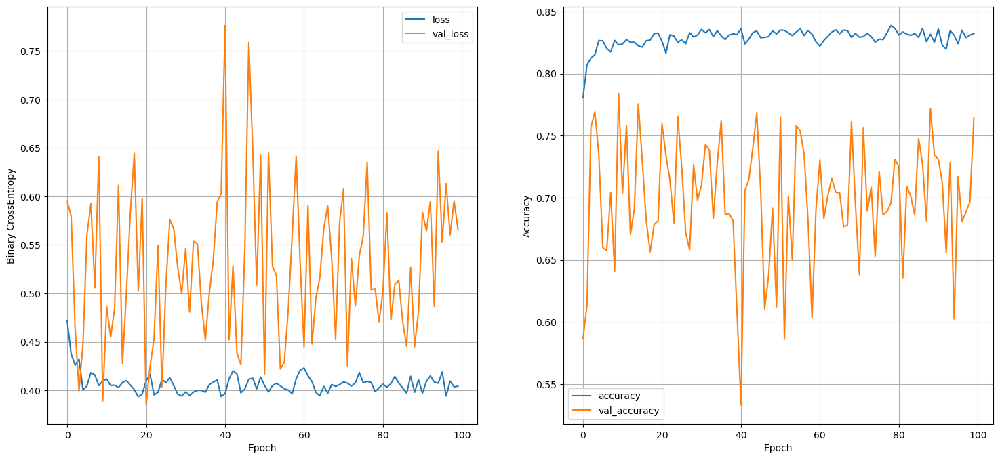

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8567 - loss: 0.4062
16 nodes 0.2 dropout 0.005 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7540 - loss: 0.5097 - val_accuracy: 0.6893 - val_loss: 0.5664
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8187 - loss: 0.4131 - val_accuracy: 0.6856 - val_loss: 0.5974
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8371 - loss: 0.3816 - val_accuracy: 0.6660 - val_loss: 0.6181
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8491 - loss: 0.3668 - val_accuracy: 0.7558 - val_loss: 0.4622
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8437 - loss: 0.3746 - val_accuracy: 0.7862 - val_loss: 0.4182
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8498 - loss: 0.3581 - val_accuracy: 0.7687 - val_loss: 0.4181
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8467 - loss: 0.3588 - val_acc

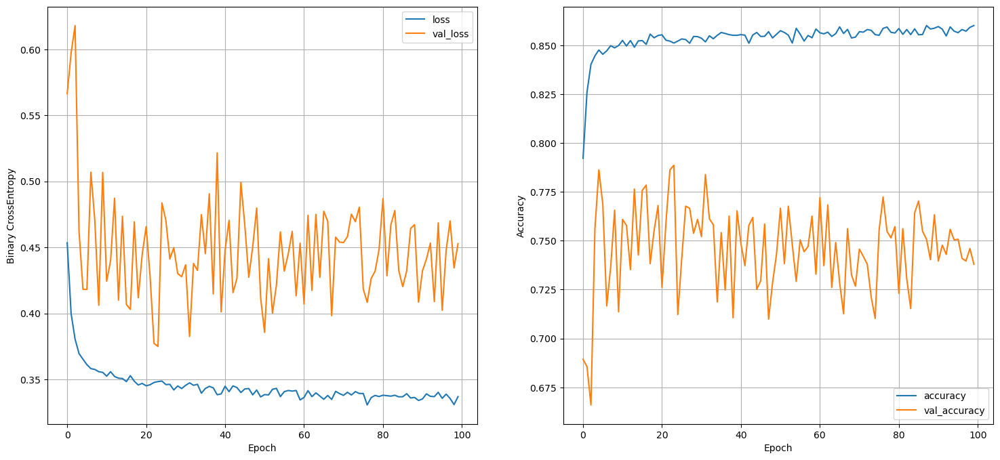

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8658 - loss: 0.3240
16 nodes 0.2 dropout 0.005 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7417 - loss: 0.5361 - val_accuracy: 0.6579 - val_loss: 0.5680
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7981 - loss: 0.4396 - val_accuracy: 0.6863 - val_loss: 0.5563
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8222 - loss: 0.4014 - val_accuracy: 0.7119 - val_loss: 0.5621
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8347 - loss: 0.3828 - val_accuracy: 0.7437 - val_loss: 0.4927
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8487 - loss: 0.3621 - val_accuracy: 0.7264 - val_loss: 0.5126
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8413 - loss: 0.3766 - val_accuracy: 0.7369 - val_loss: 0.4916
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8417 - loss: 0.3769 - val_acc

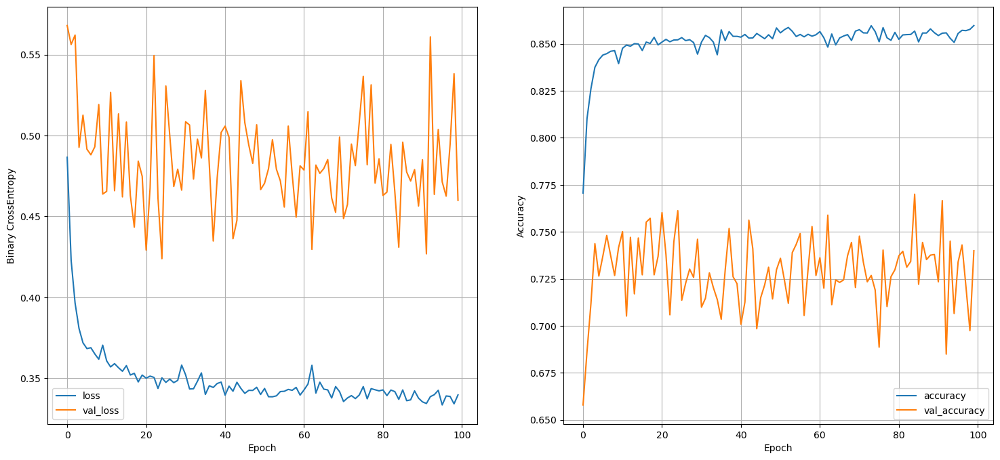

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8682 - loss: 0.3177
16 nodes 0.2 dropout 0.005 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6976 - loss: 0.5607 - val_accuracy: 0.5971 - val_loss: 0.6000
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7953 - loss: 0.4364 - val_accuracy: 0.6795 - val_loss: 0.5513
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8144 - loss: 0.4223 - val_accuracy: 0.7758 - val_loss: 0.4658
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8218 - loss: 0.3985 - val_accuracy: 0.7315 - val_loss: 0.5456
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8383 - loss: 0.3792 - val_accuracy: 0.7376 - val_loss: 0.5133
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8464 - loss: 0.3686 - val_accuracy: 0.7666 - val_loss: 0.4512
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8399 - loss: 0.3765 - val_accuracy: 0.7649

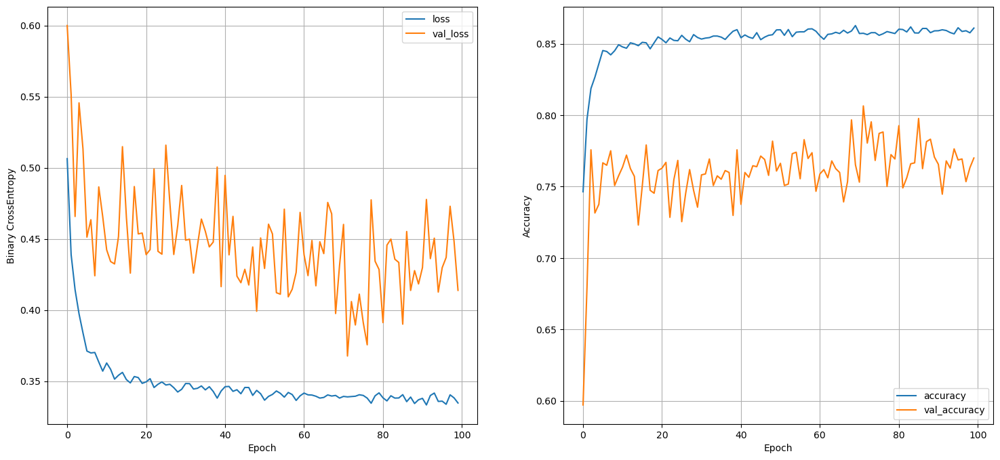

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8725 - loss: 0.3203
16 nodes 0.2 dropout 0.001 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.6326 - loss: 0.6338 - val_accuracy: 0.6022 - val_loss: 0.6391
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7584 - loss: 0.5031 - val_accuracy: 0.6616 - val_loss: 0.5944
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8022 - loss: 0.4487 - val_accuracy: 0.6744 - val_loss: 0.5682
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8097 - loss: 0.4302 - val_accuracy: 0.6906 - val_loss: 0.5475
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8189 - loss: 0.4206 - val_accuracy: 0.7035 - val_loss: 0.5354
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8262 - loss: 0.4018 - val_accuracy: 0.7106 - val_loss: 0.5275
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8291 - loss: 0.3961 - val_acc

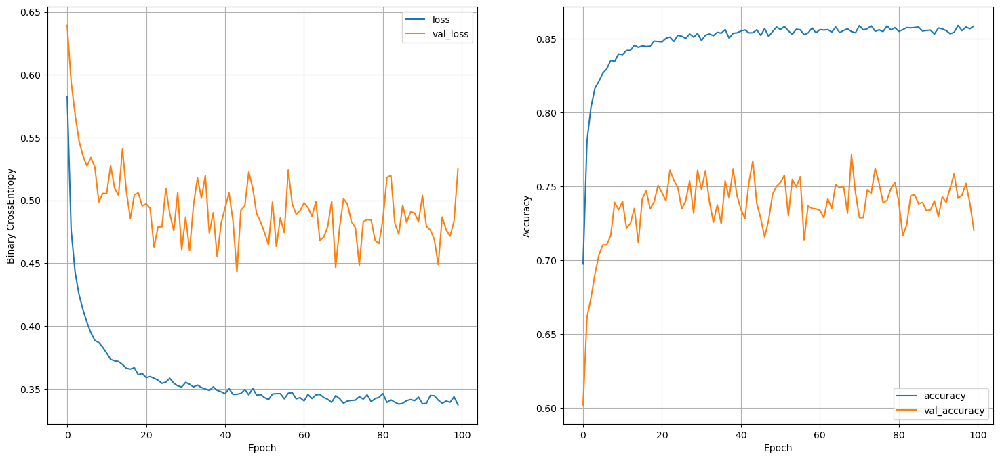

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8651 - loss: 0.3190
16 nodes 0.2 dropout 0.001 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6560 - loss: 0.6100 - val_accuracy: 0.5569 - val_loss: 0.6703
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7714 - loss: 0.4801 - val_accuracy: 0.5924 - val_loss: 0.6175
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7827 - loss: 0.4566 - val_accuracy: 0.6184 - val_loss: 0.5908
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7991 - loss: 0.4409 - val_accuracy: 0.6272 - val_loss: 0.6128
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8019 - loss: 0.4387 - val_accuracy: 0.6413 - val_loss: 0.6112
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8121 - loss: 0.4245 - val_accuracy: 0.6798 - val_loss: 0.5582
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8148 - loss: 0.4238 - val_acc

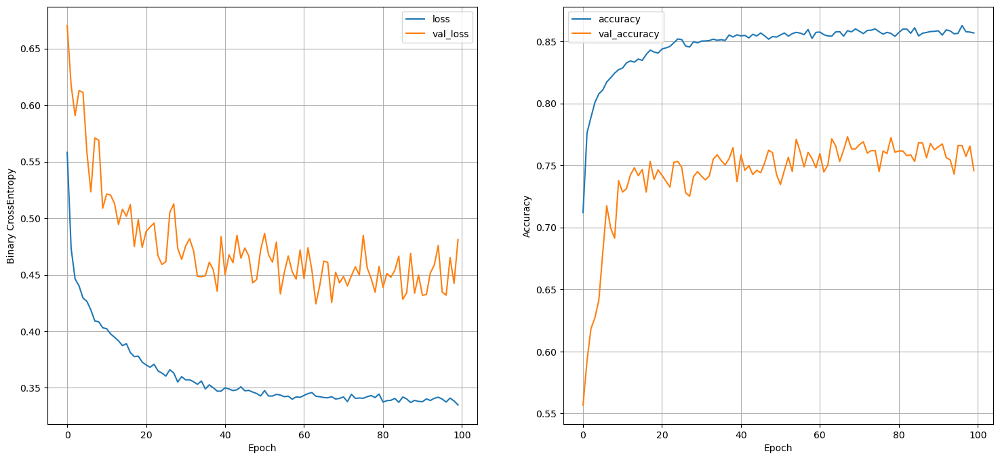

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8687 - loss: 0.3150
16 nodes 0.2 dropout 0.001 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5967 - loss: 0.6718 - val_accuracy: 0.5370 - val_loss: 0.6503
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7447 - loss: 0.5436 - val_accuracy: 0.5849 - val_loss: 0.6362
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7688 - loss: 0.4913 - val_accuracy: 0.6113 - val_loss: 0.6110
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7841 - loss: 0.4691 - val_accuracy: 0.6204 - val_loss: 0.6109
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7853 - loss: 0.4647 - val_accuracy: 0.6454 - val_loss: 0.5678
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7994 - loss: 0.4430 - val_accuracy: 0.6505 - val_loss: 0.5776
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8001 - loss: 0.4374 - val_accuracy: 0.6484

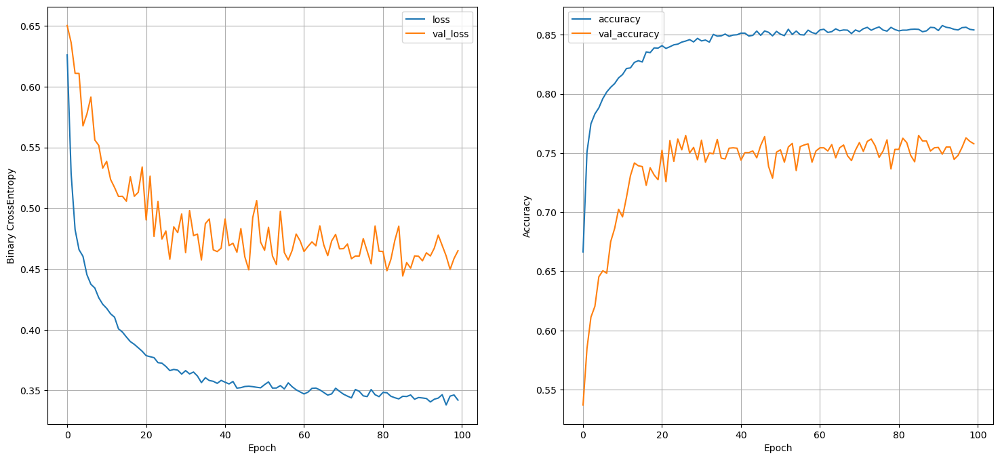

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8695 - loss: 0.3135
32 nodes 0 dropout 0.1 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7667 - loss: 0.5100 - val_accuracy: 0.7072 - val_loss: 0.6238
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8299 - loss: 0.4126 - val_accuracy: 0.9855 - val_loss: 0.2162
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7110 - loss: 0.6258 - val_accuracy: 0.3208 - val_loss: 0.8545
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7352 - loss: 0.6072 - val_accuracy: 0.4505 - val_loss: 0.9316
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7990 - loss: 0.4924 - val_accuracy: 0.6224 - val_loss: 0.6702
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8267 - loss: 0.4449 - val_accuracy: 0.6562 - val_loss: 0.6884
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8349 - loss: 0.4201 - val_accurac

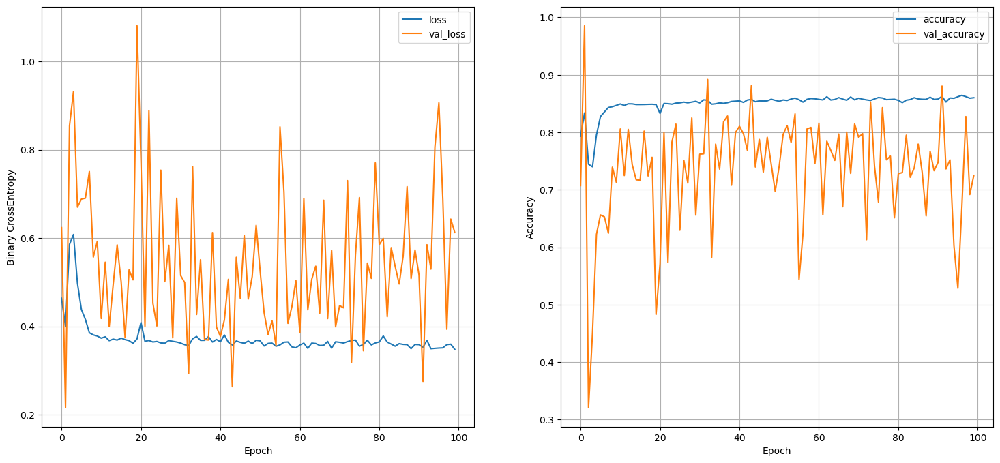

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8632 - loss: 0.3711
32 nodes 0 dropout 0.1 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.7723 - loss: 0.4788 - val_accuracy: 0.7048 - val_loss: 0.5551
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8488 - loss: 0.3656 - val_accuracy: 0.6211 - val_loss: 0.6711
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8451 - loss: 0.3631 - val_accuracy: 0.7771 - val_loss: 0.3492
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8276 - loss: 0.4282 - val_accuracy: 0.7521 - val_loss: 0.4832
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8618 - loss: 0.3413 - val_accuracy: 0.7558 - val_loss: 0.4628
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8504 - loss: 0.3498 - val_accuracy: 0.6511 - val_loss: 0.5588
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8528 - loss: 0.3511 - val_accurac

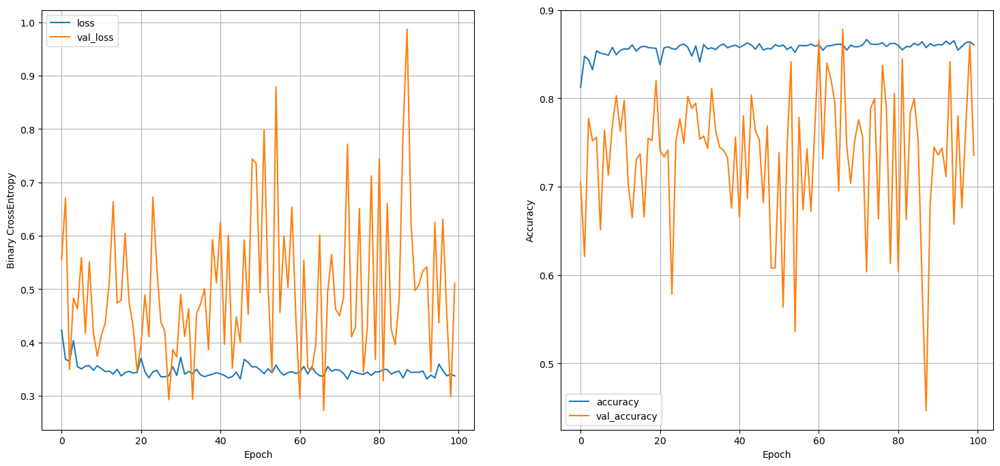

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8639 - loss: 0.3417
32 nodes 0 dropout 0.1 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7876 - loss: 0.4557 - val_accuracy: 0.7119 - val_loss: 0.4556
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8458 - loss: 0.3674 - val_accuracy: 0.7271 - val_loss: 0.5190
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8556 - loss: 0.3459 - val_accuracy: 0.7386 - val_loss: 0.5765
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8583 - loss: 0.3399 - val_accuracy: 0.8109 - val_loss: 0.4264
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8606 - loss: 0.3426 - val_accuracy: 0.7139 - val_loss: 0.5833
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8657 - loss: 0.3392 - val_accuracy: 0.7437 - val_loss: 0.5535
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8601 - loss: 0.3298 - val_accuracy: 0.7592 - v

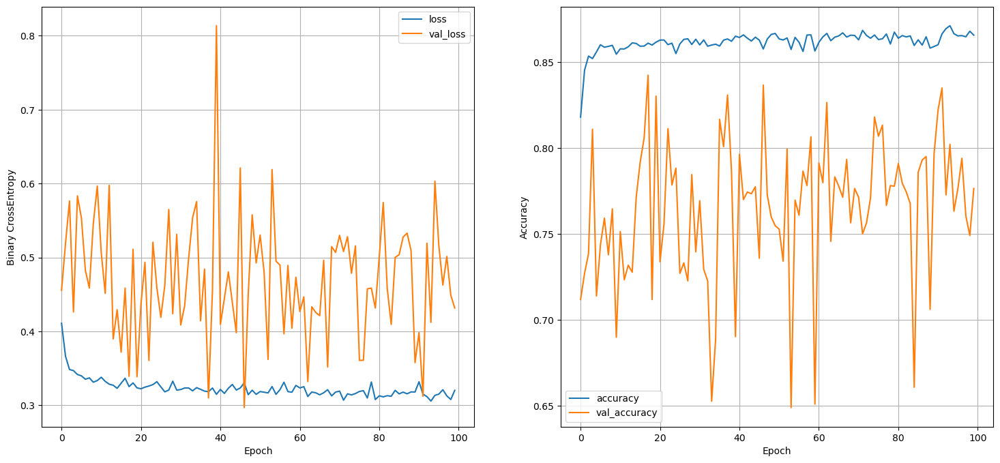

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8639 - loss: 0.3333
32 nodes 0 dropout 0.005 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8057 - loss: 0.4309 - val_accuracy: 0.7703 - val_loss: 0.4512
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8533 - loss: 0.3393 - val_accuracy: 0.8176 - val_loss: 0.3424
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8635 - loss: 0.3319 - val_accuracy: 0.7703 - val_loss: 0.4510
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8564 - loss: 0.3322 - val_accuracy: 0.7815 - val_loss: 0.3864
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8598 - loss: 0.3240 - val_accuracy: 0.7454 - val_loss: 0.4784
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8624 - loss: 0.3253 - val_accuracy: 0.7501 - val_loss: 0.5058
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8599 - loss: 0.3356 - val_accur

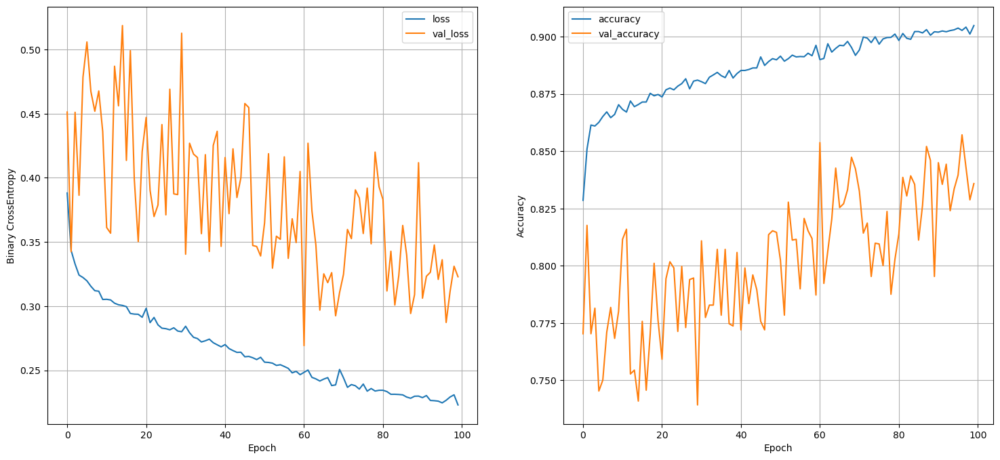

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8698 - loss: 0.3623
32 nodes 0 dropout 0.005 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7522 - loss: 0.4881 - val_accuracy: 0.6636 - val_loss: 0.6537
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8521 - loss: 0.3479 - val_accuracy: 0.7700 - val_loss: 0.4404
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8433 - loss: 0.3557 - val_accuracy: 0.7720 - val_loss: 0.4341
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8647 - loss: 0.3237 - val_accuracy: 0.7035 - val_loss: 0.5696
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8691 - loss: 0.3132 - val_accuracy: 0.8102 - val_loss: 0.3643
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8657 - loss: 0.3135 - val_accuracy: 0.7528 - val_loss: 0.4831
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8647 - loss: 0.3166 - val_accur

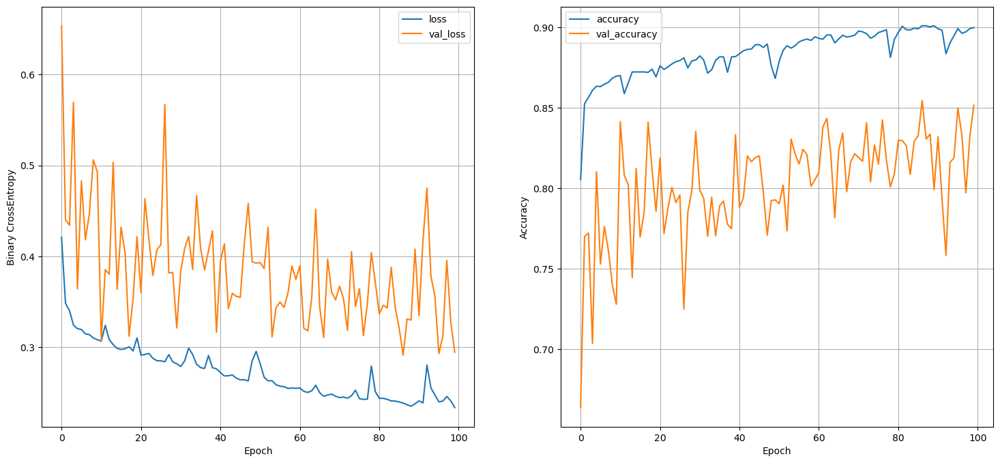

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8709 - loss: 0.3511
32 nodes 0 dropout 0.005 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7493 - loss: 0.5024 - val_accuracy: 0.6589 - val_loss: 0.6246
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8526 - loss: 0.3503 - val_accuracy: 0.7521 - val_loss: 0.4587
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8567 - loss: 0.3398 - val_accuracy: 0.7781 - val_loss: 0.4484
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8617 - loss: 0.3269 - val_accuracy: 0.7822 - val_loss: 0.4042
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8692 - loss: 0.3147 - val_accuracy: 0.7761 - val_loss: 0.4248
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8638 - loss: 0.3118 - val_accuracy: 0.7582 - val_loss: 0.4657
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8662 - loss: 0.3172 - val_accuracy: 0.7720 -

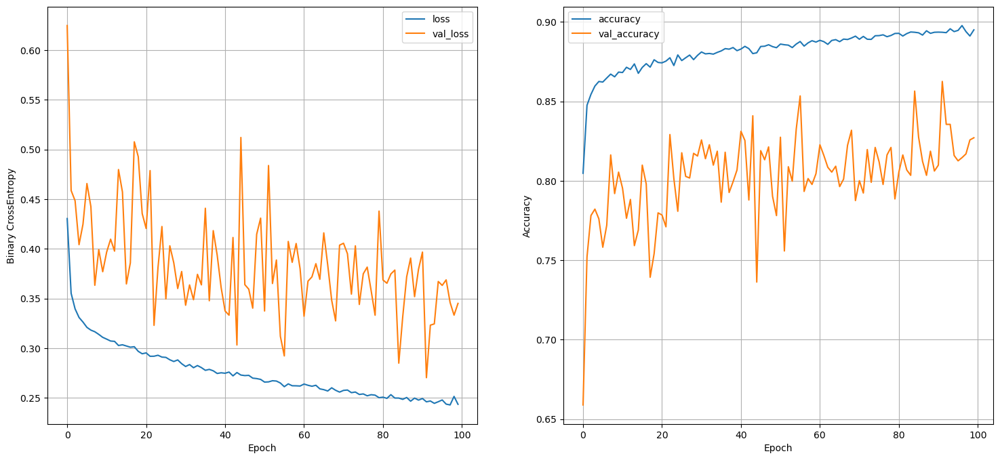

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8690 - loss: 0.3530
32 nodes 0 dropout 0.001 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7405 - loss: 0.5247 - val_accuracy: 0.7028 - val_loss: 0.5214
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8292 - loss: 0.3904 - val_accuracy: 0.7639 - val_loss: 0.4605
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8427 - loss: 0.3688 - val_accuracy: 0.7720 - val_loss: 0.4587
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8484 - loss: 0.3609 - val_accuracy: 0.7693 - val_loss: 0.4610
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8584 - loss: 0.3372 - val_accuracy: 0.7433 - val_loss: 0.5083
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8557 - loss: 0.3440 - val_accuracy: 0.7882 - val_loss: 0.4219
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8542 - loss: 0.3421 - val_accur

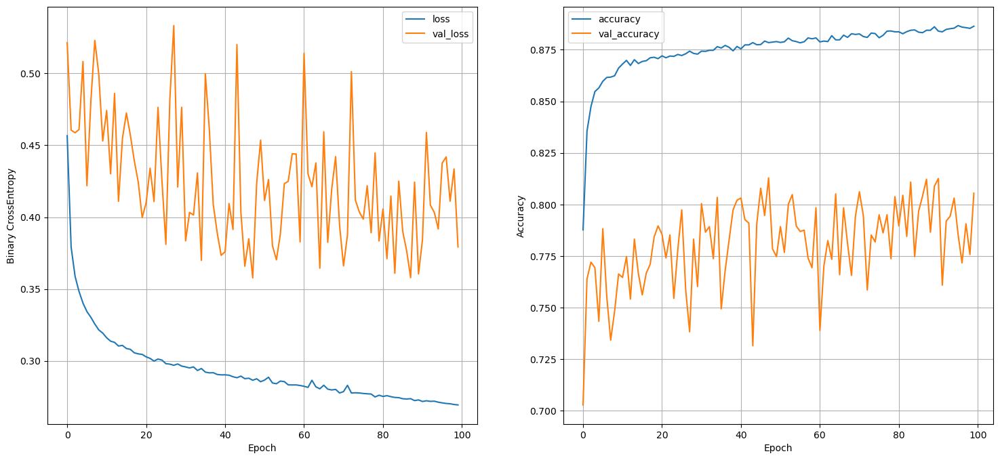

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8753 - loss: 0.3179
32 nodes 0 dropout 0.001 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7009 - loss: 0.5884 - val_accuracy: 0.6572 - val_loss: 0.5902
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8189 - loss: 0.4084 - val_accuracy: 0.7295 - val_loss: 0.5000
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8331 - loss: 0.3780 - val_accuracy: 0.7278 - val_loss: 0.5192
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8424 - loss: 0.3654 - val_accuracy: 0.7609 - val_loss: 0.4752
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8476 - loss: 0.3560 - val_accuracy: 0.7474 - val_loss: 0.5075
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8563 - loss: 0.3361 - val_accuracy: 0.7511 - val_loss: 0.4947
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8531 - loss: 0.3463 - val_accur

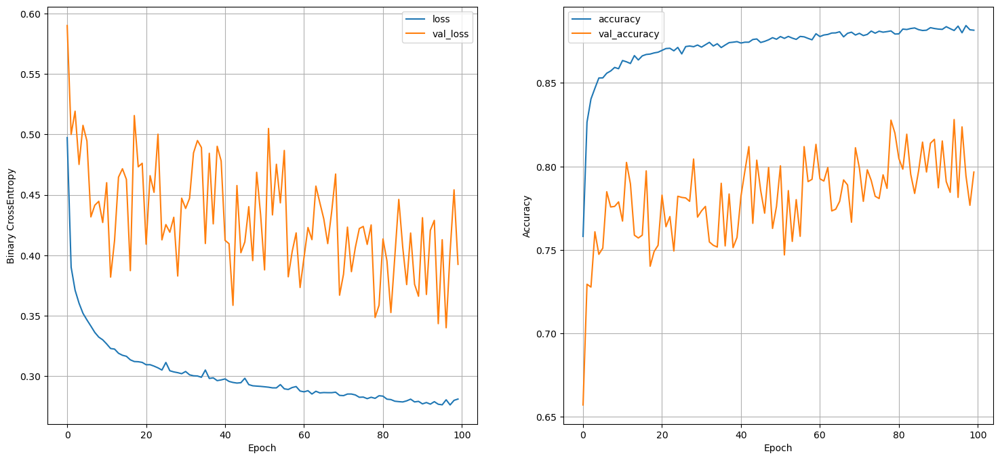

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - accuracy: 0.8625 - loss: 0.3178
32 nodes 0 dropout 0.001 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6722 - loss: 0.6155 - val_accuracy: 0.6201 - val_loss: 0.5947
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8171 - loss: 0.4098 - val_accuracy: 0.6890 - val_loss: 0.5398
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8360 - loss: 0.3858 - val_accuracy: 0.7359 - val_loss: 0.5043
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8410 - loss: 0.3706 - val_accuracy: 0.7318 - val_loss: 0.5200
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8547 - loss: 0.3548 - val_accuracy: 0.7190 - val_loss: 0.5555
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8548 - loss: 0.3510 - val_accuracy: 0.7305 - val_loss: 0.5364
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8554 - loss: 0.3484 - val_accuracy: 0.7676

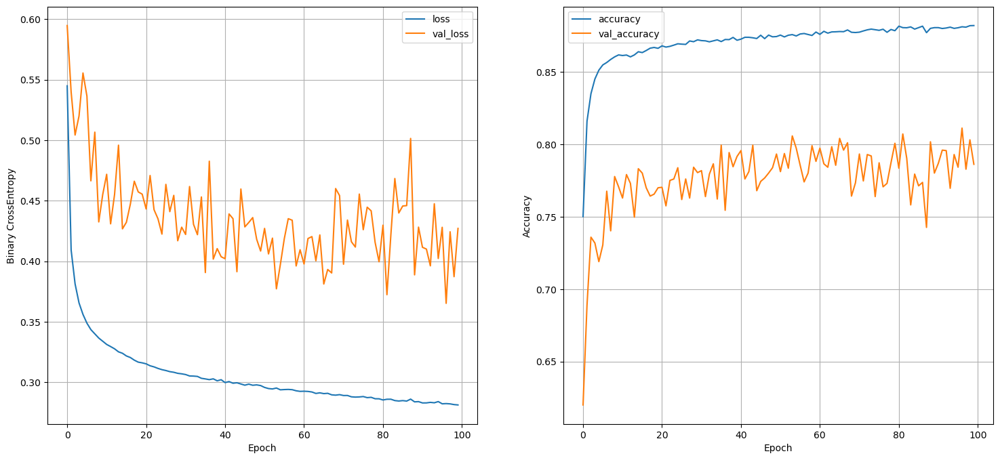

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - accuracy: 0.8739 - loss: 0.3152
32 nodes 0.2 dropout 0.1 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7371 - loss: 0.5473 - val_accuracy: 0.8507 - val_loss: 0.5687
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6910 - loss: 0.5875 - val_accuracy: 0.7612 - val_loss: 1.0878
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7454 - loss: 0.5293 - val_accuracy: 0.4995 - val_loss: 0.6136
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7491 - loss: 0.4801 - val_accuracy: 0.7953 - val_loss: 0.4428
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7098 - loss: 0.5960 - val_accuracy: 0.3668 - val_loss: 0.6608
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7091 - loss: 0.5707 - val_accuracy: 0.3590 - val_loss: 0.7881
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7021 - loss: 0.5554 - val_acc

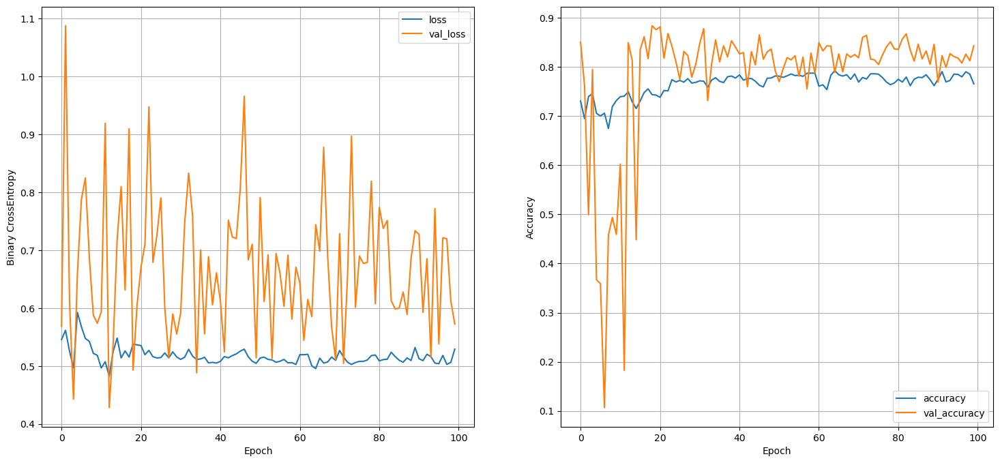

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7916 - loss: 0.4871
32 nodes 0.2 dropout 0.1 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7522 - loss: 0.5329 - val_accuracy: 0.6947 - val_loss: 0.5935
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7886 - loss: 0.4686 - val_accuracy: 0.6130 - val_loss: 0.5517
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7693 - loss: 0.4970 - val_accuracy: 0.5093 - val_loss: 0.5928
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7836 - loss: 0.4708 - val_accuracy: 0.6626 - val_loss: 0.4468
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7846 - loss: 0.4525 - val_accuracy: 0.3833 - val_loss: 0.7433
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7365 - loss: 0.4869 - val_accuracy: 0.2763 - val_loss: 0.6201
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7356 - loss: 0.5171 - val_accur

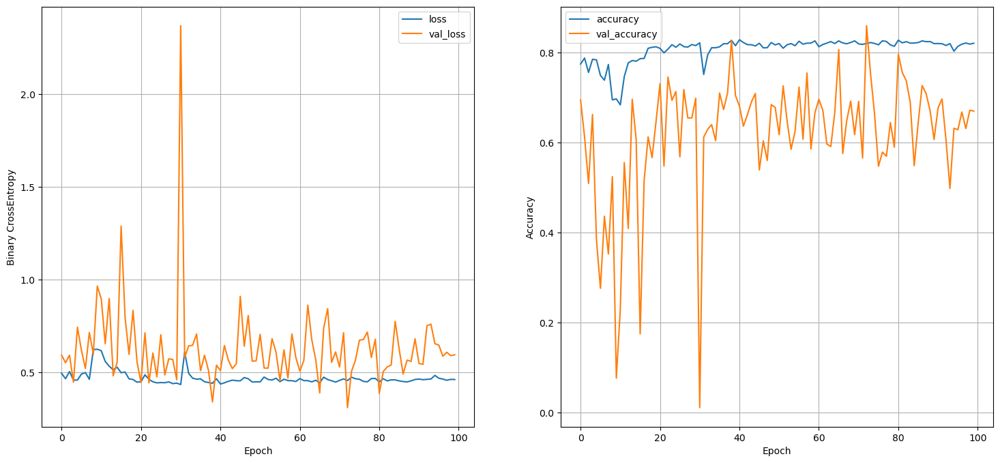

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8491 - loss: 0.4079
32 nodes 0.2 dropout 0.1 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7540 - loss: 0.5326 - val_accuracy: 0.6471 - val_loss: 0.5423
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8188 - loss: 0.4318 - val_accuracy: 0.6940 - val_loss: 0.4363
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8151 - loss: 0.4235 - val_accuracy: 0.6123 - val_loss: 0.6322
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8178 - loss: 0.4072 - val_accuracy: 0.7345 - val_loss: 0.4524
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8310 - loss: 0.4080 - val_accuracy: 0.6228 - val_loss: 0.5823
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8227 - loss: 0.4043 - val_accuracy: 0.6366 - val_loss: 0.4874
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8227 - loss: 0.4110 - val_accuracy: 0.6454 -

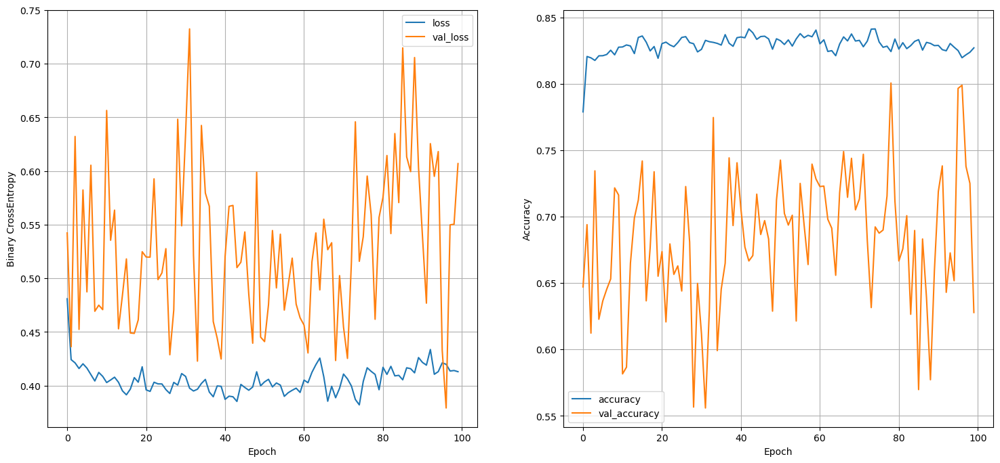

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8366 - loss: 0.3801
32 nodes 0.2 dropout 0.005 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7643 - loss: 0.4910 - val_accuracy: 0.7254 - val_loss: 0.5196
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8340 - loss: 0.3831 - val_accuracy: 0.7427 - val_loss: 0.4860
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8357 - loss: 0.3805 - val_accuracy: 0.7646 - val_loss: 0.4283
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8442 - loss: 0.3617 - val_accuracy: 0.7524 - val_loss: 0.4507
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8527 - loss: 0.3547 - val_accuracy: 0.7487 - val_loss: 0.4576
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8515 - loss: 0.3489 - val_accuracy: 0.7018 - val_loss: 0.5457
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8561 - loss: 0.3427 - val_acc

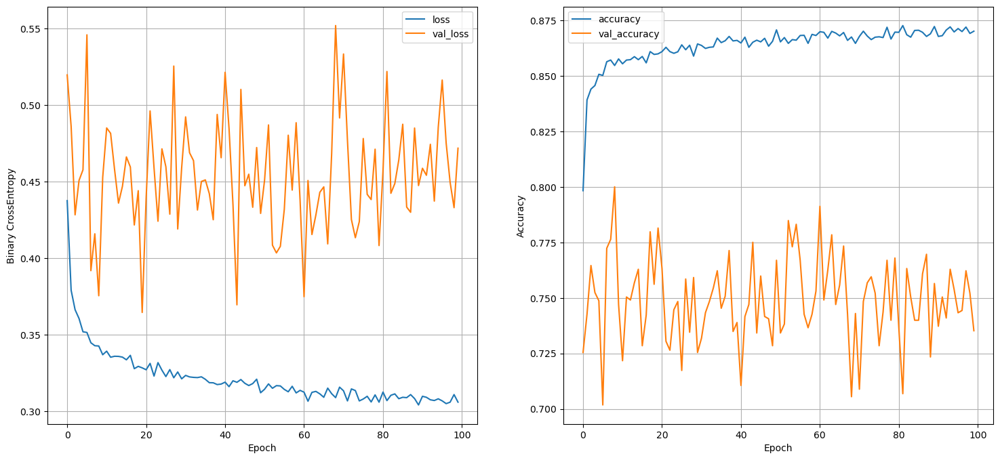

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8696 - loss: 0.3131
32 nodes 0.2 dropout 0.005 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7513 - loss: 0.5072 - val_accuracy: 0.7096 - val_loss: 0.5344
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8254 - loss: 0.3997 - val_accuracy: 0.7565 - val_loss: 0.4625
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8409 - loss: 0.3742 - val_accuracy: 0.7538 - val_loss: 0.4988
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8491 - loss: 0.3618 - val_accuracy: 0.7690 - val_loss: 0.4573
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8489 - loss: 0.3629 - val_accuracy: 0.7413 - val_loss: 0.4750
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8503 - loss: 0.3515 - val_accuracy: 0.7062 - val_loss: 0.5204
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8553 - loss: 0.3426 - val_acc

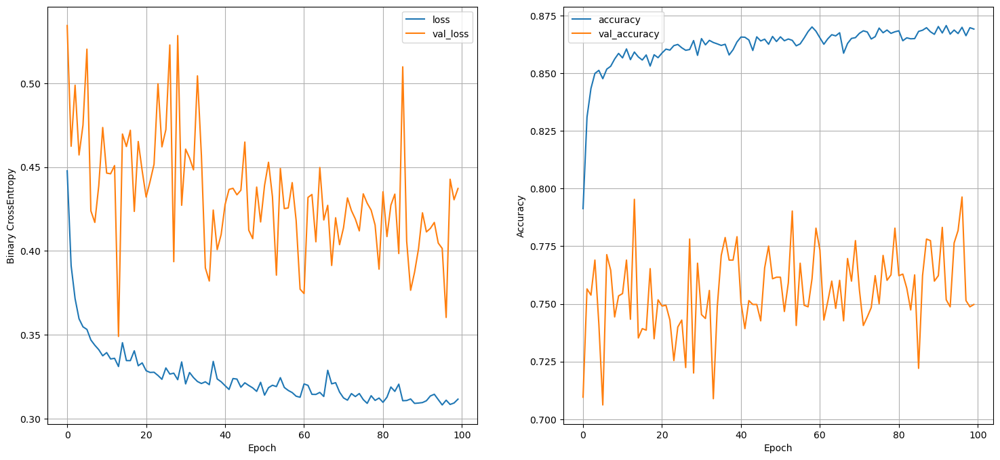

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8691 - loss: 0.3152
32 nodes 0.2 dropout 0.005 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7401 - loss: 0.5330 - val_accuracy: 0.6613 - val_loss: 0.5931
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8269 - loss: 0.3941 - val_accuracy: 0.7187 - val_loss: 0.5404
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8360 - loss: 0.3833 - val_accuracy: 0.7369 - val_loss: 0.4918
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8438 - loss: 0.3667 - val_accuracy: 0.7227 - val_loss: 0.5436
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8515 - loss: 0.3532 - val_accuracy: 0.7602 - val_loss: 0.4439
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8466 - loss: 0.3550 - val_accuracy: 0.7467 - val_loss: 0.4642
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8514 - loss: 0.3495 - val_accuracy: 0.7595

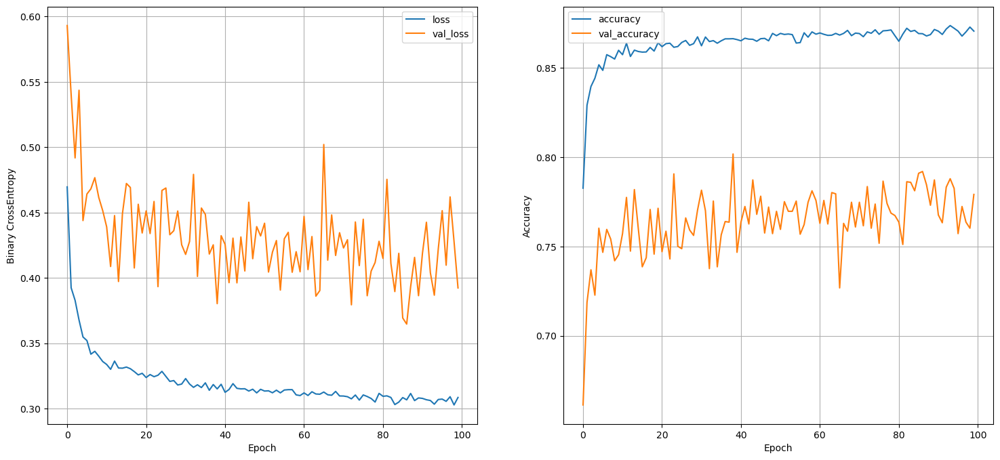

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8790 - loss: 0.3051
32 nodes 0.2 dropout 0.001 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.6845 - loss: 0.5852 - val_accuracy: 0.6123 - val_loss: 0.6368
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7959 - loss: 0.4390 - val_accuracy: 0.6754 - val_loss: 0.5669
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8142 - loss: 0.4122 - val_accuracy: 0.7224 - val_loss: 0.5180
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8251 - loss: 0.3977 - val_accuracy: 0.7430 - val_loss: 0.4976
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8332 - loss: 0.3841 - val_accuracy: 0.7248 - val_loss: 0.5114
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8369 - loss: 0.3793 - val_accuracy: 0.7501 - val_loss: 0.4796
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8417 - loss: 0.3715 - val_acc

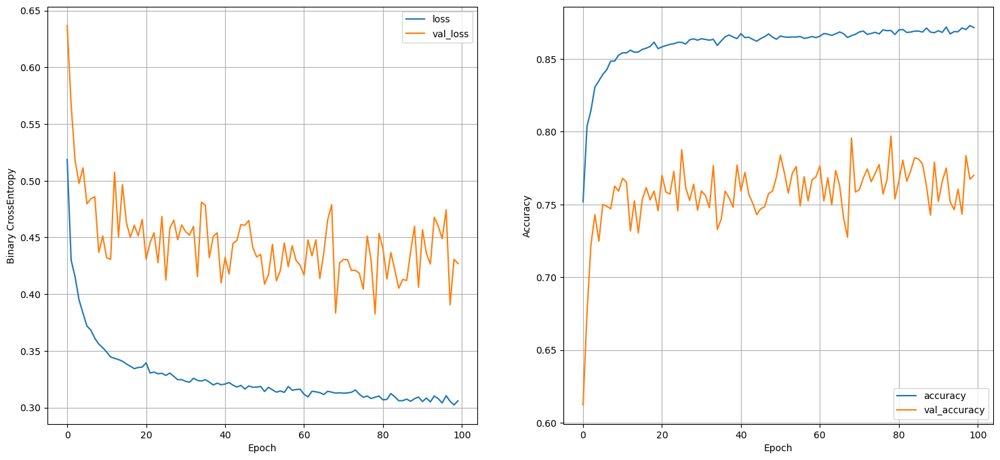

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8707 - loss: 0.3118
32 nodes 0.2 dropout 0.001 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7021 - loss: 0.5988 - val_accuracy: 0.6498 - val_loss: 0.6248
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8018 - loss: 0.4324 - val_accuracy: 0.6771 - val_loss: 0.5667
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8152 - loss: 0.4158 - val_accuracy: 0.6890 - val_loss: 0.5608
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8212 - loss: 0.4090 - val_accuracy: 0.7109 - val_loss: 0.5487
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8338 - loss: 0.3896 - val_accuracy: 0.7521 - val_loss: 0.4848
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8314 - loss: 0.3972 - val_accuracy: 0.7052 - val_loss: 0.5740
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8403 - loss: 0.3789 - val_acc

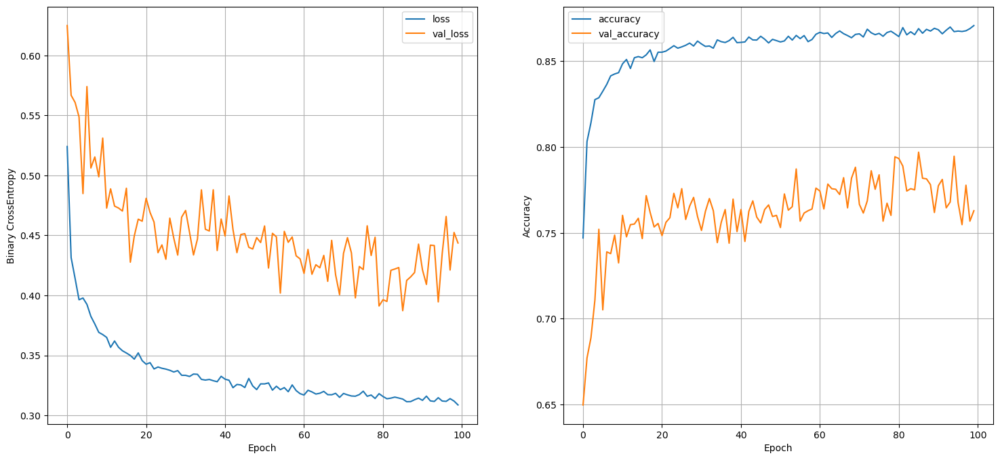

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8746 - loss: 0.3080
32 nodes 0.2 dropout 0.001 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6177 - loss: 0.6452 - val_accuracy: 0.5762 - val_loss: 0.6222
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7755 - loss: 0.4721 - val_accuracy: 0.6255 - val_loss: 0.6002
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7980 - loss: 0.4487 - val_accuracy: 0.6707 - val_loss: 0.5714
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7998 - loss: 0.4331 - val_accuracy: 0.7085 - val_loss: 0.5283
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8208 - loss: 0.4147 - val_accuracy: 0.6788 - val_loss: 0.5791
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8236 - loss: 0.4012 - val_accuracy: 0.6974 - val_loss: 0.5479
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8292 - loss: 0.3947 - val_accuracy: 0.7278

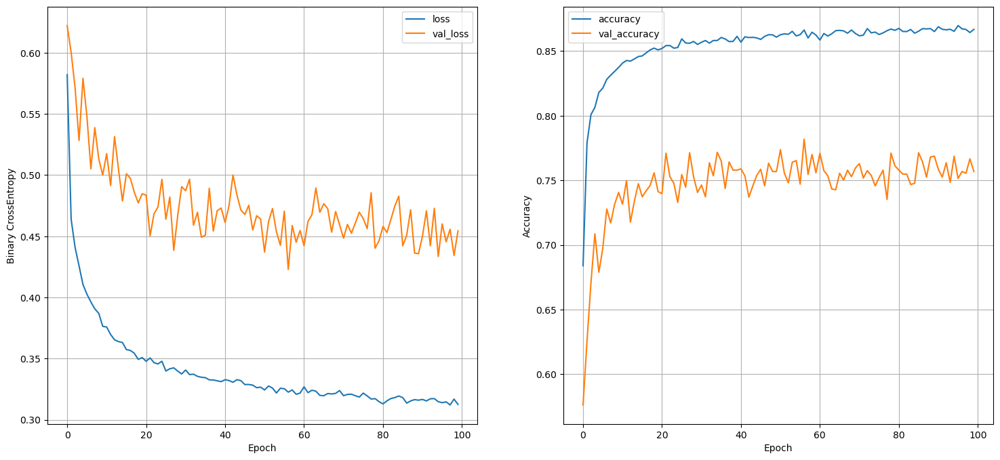

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8733 - loss: 0.3083
64 nodes 0 dropout 0.1 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7724 - loss: 0.5639 - val_accuracy: 0.5495 - val_loss: 1.6562
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8247 - loss: 0.4194 - val_accuracy: 0.6420 - val_loss: 0.9733
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8239 - loss: 0.4239 - val_accuracy: 0.8632 - val_loss: 0.3284
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8453 - loss: 0.3875 - val_accuracy: 0.8251 - val_loss: 0.3931
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8463 - loss: 0.3758 - val_accuracy: 0.8116 - val_loss: 0.4443
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8499 - loss: 0.3632 - val_accuracy: 0.7028 - val_loss: 0.7394
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8429 - loss: 0.3775 - val_accurac

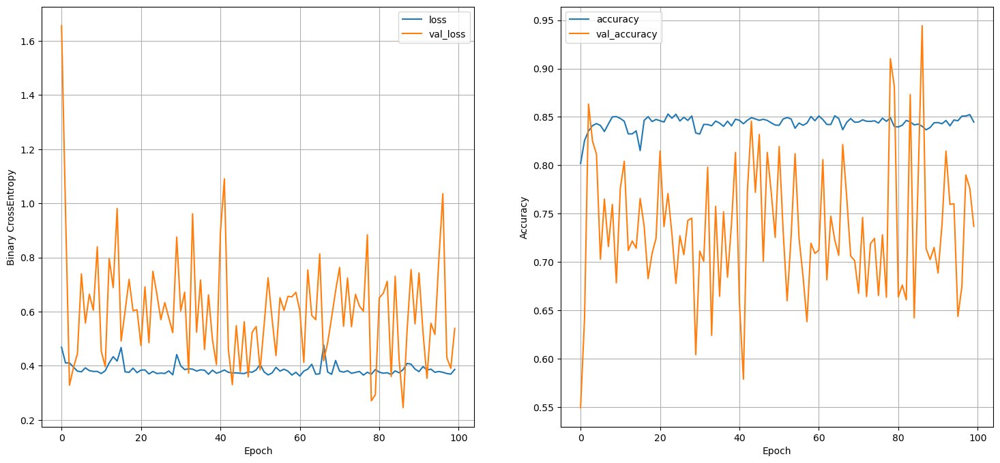

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8465 - loss: 0.3637
64 nodes 0 dropout 0.1 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7608 - loss: 0.5187 - val_accuracy: 0.7227 - val_loss: 0.8127
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8276 - loss: 0.4010 - val_accuracy: 0.6775 - val_loss: 0.8531
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8250 - loss: 0.4028 - val_accuracy: 0.5241 - val_loss: 0.5213
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8346 - loss: 0.3894 - val_accuracy: 0.7291 - val_loss: 0.9044
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8440 - loss: 0.3912 - val_accuracy: 0.7329 - val_loss: 0.5902
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8509 - loss: 0.3691 - val_accuracy: 0.7545 - val_loss: 0.4378
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8546 - loss: 0.3713 - val_accurac

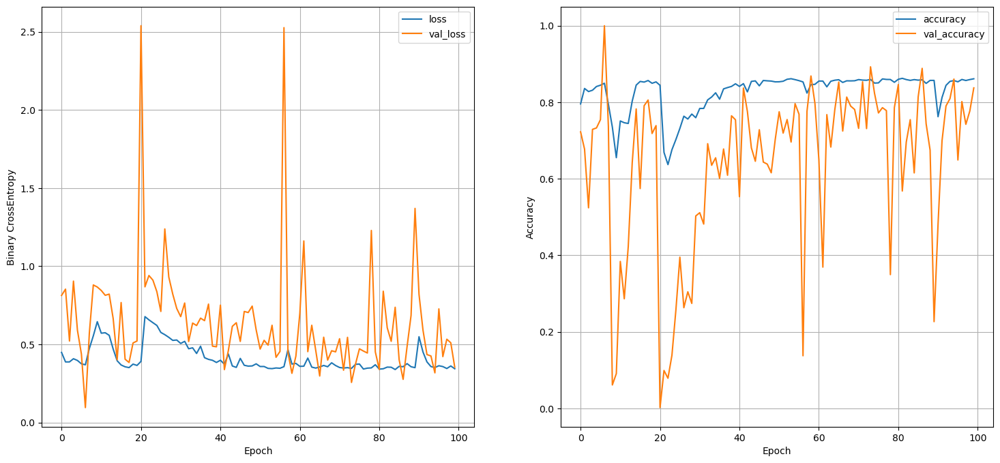

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8518 - loss: 0.4212
64 nodes 0 dropout 0.1 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7583 - loss: 0.6305 - val_accuracy: 0.7487 - val_loss: 0.5021
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8347 - loss: 0.3867 - val_accuracy: 0.7568 - val_loss: 0.3725
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8460 - loss: 0.3754 - val_accuracy: 0.7805 - val_loss: 0.3362
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8583 - loss: 0.3444 - val_accuracy: 0.6900 - val_loss: 0.4478
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8559 - loss: 0.3411 - val_accuracy: 0.6788 - val_loss: 0.4701
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8546 - loss: 0.3439 - val_accuracy: 0.6798 - val_loss: 0.4723
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8348 - loss: 0.3718 - val_accuracy: 0.7457 - v

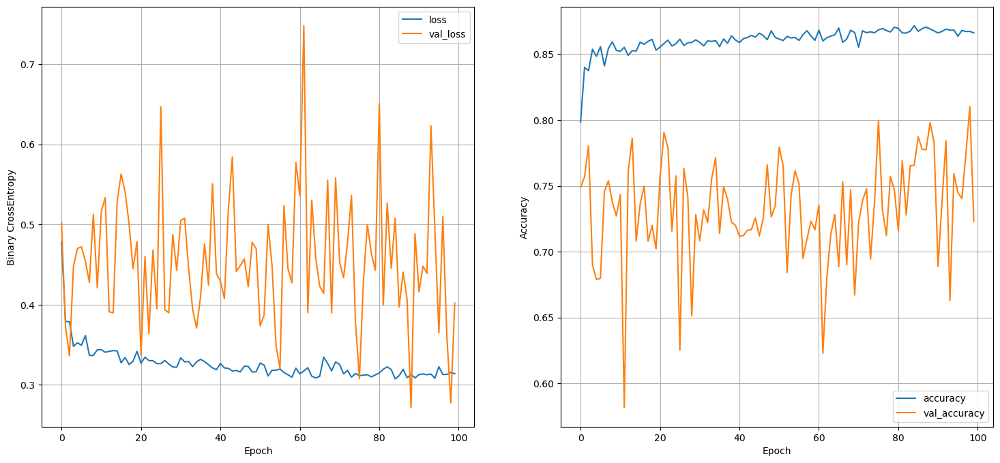

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8635 - loss: 0.3299
64 nodes 0 dropout 0.005 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7943 - loss: 0.4349 - val_accuracy: 0.7129 - val_loss: 0.5756
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8523 - loss: 0.3478 - val_accuracy: 0.8315 - val_loss: 0.3370
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8550 - loss: 0.3384 - val_accuracy: 0.7805 - val_loss: 0.3991
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8649 - loss: 0.3208 - val_accuracy: 0.6741 - val_loss: 0.6028
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8587 - loss: 0.3369 - val_accuracy: 0.7345 - val_loss: 0.5183
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8730 - loss: 0.3112 - val_accuracy: 0.7845 - val_loss: 0.3907
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8694 - loss: 0.3073 - val_accur

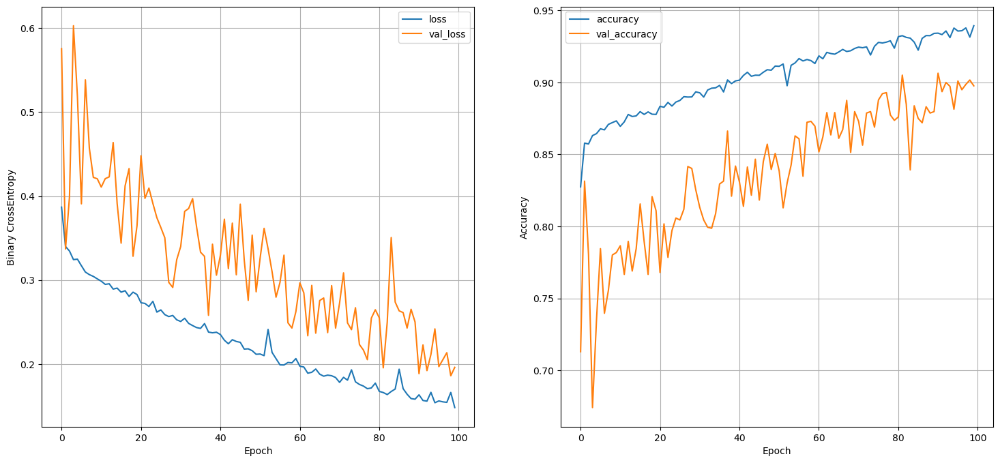

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8519 - loss: 0.5176
64 nodes 0 dropout 0.005 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7929 - loss: 0.4403 - val_accuracy: 0.7683 - val_loss: 0.4473
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8522 - loss: 0.3464 - val_accuracy: 0.7356 - val_loss: 0.5234
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8603 - loss: 0.3295 - val_accuracy: 0.7839 - val_loss: 0.4245
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8652 - loss: 0.3234 - val_accuracy: 0.8598 - val_loss: 0.2945
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8549 - loss: 0.3462 - val_accuracy: 0.7741 - val_loss: 0.4391
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8671 - loss: 0.3110 - val_accuracy: 0.7497 - val_loss: 0.4838
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8648 - loss: 0.3129 - val_accur

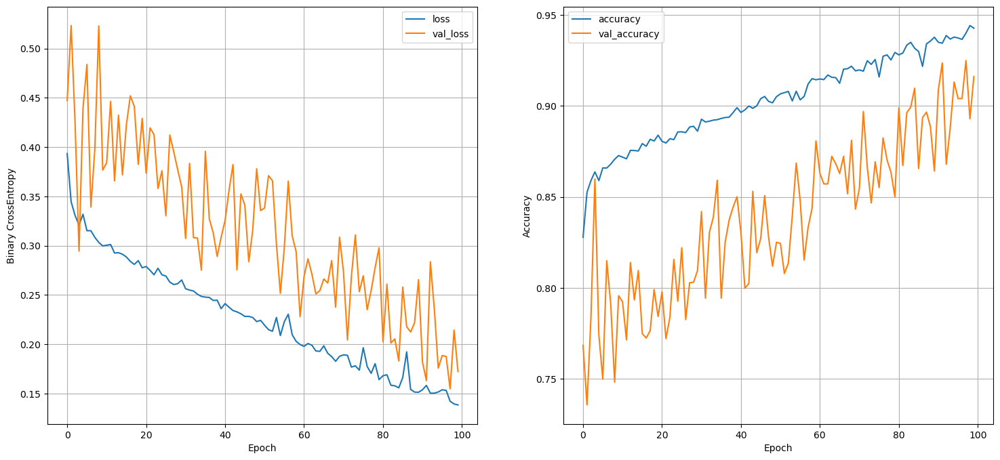

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8593 - loss: 0.5843
64 nodes 0 dropout 0.005 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7770 - loss: 0.4637 - val_accuracy: 0.7555 - val_loss: 0.4669
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8495 - loss: 0.3573 - val_accuracy: 0.7639 - val_loss: 0.4724
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8618 - loss: 0.3364 - val_accuracy: 0.7139 - val_loss: 0.5512
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8601 - loss: 0.3239 - val_accuracy: 0.7636 - val_loss: 0.4564
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8625 - loss: 0.3259 - val_accuracy: 0.7758 - val_loss: 0.4185
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8635 - loss: 0.3199 - val_accuracy: 0.7295 - val_loss: 0.5220
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8703 - loss: 0.3138 - val_accuracy: 0.7254 -

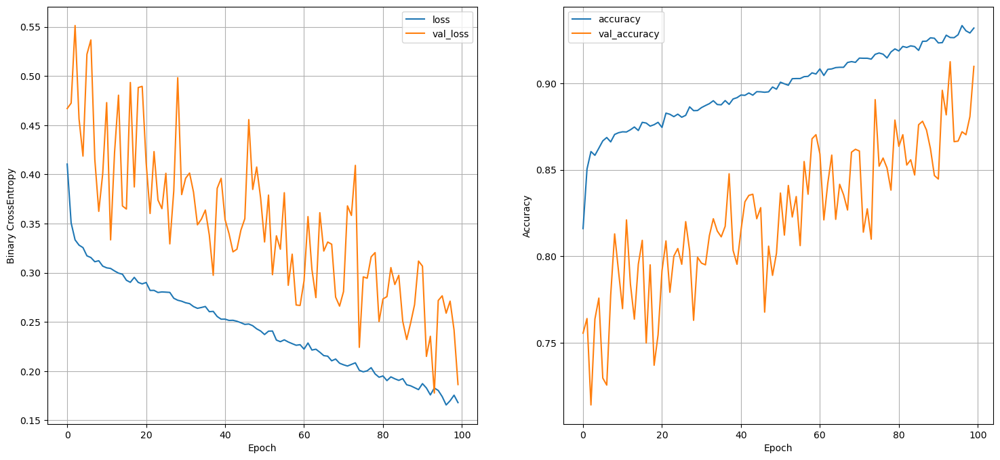

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8502 - loss: 0.4737
64 nodes 0 dropout 0.001 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7600 - loss: 0.4924 - val_accuracy: 0.7798 - val_loss: 0.4503
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8403 - loss: 0.3676 - val_accuracy: 0.7616 - val_loss: 0.4646
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8592 - loss: 0.3436 - val_accuracy: 0.7349 - val_loss: 0.5084
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8588 - loss: 0.3354 - val_accuracy: 0.7690 - val_loss: 0.4411
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8647 - loss: 0.3260 - val_accuracy: 0.7781 - val_loss: 0.4200
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8572 - loss: 0.3277 - val_accuracy: 0.7275 - val_loss: 0.5436
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8606 - loss: 0.3241 - val_accur

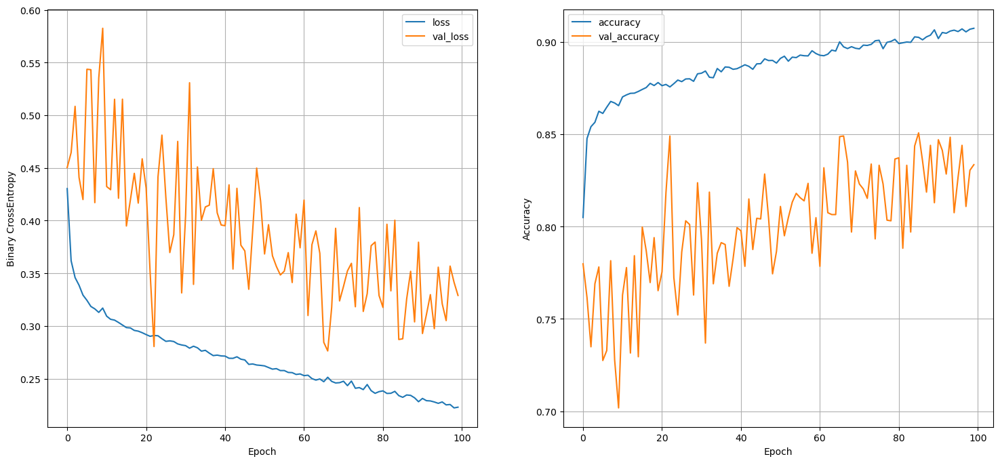

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8634 - loss: 0.3404
64 nodes 0 dropout 0.001 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7543 - loss: 0.5205 - val_accuracy: 0.6775 - val_loss: 0.5507
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8340 - loss: 0.3780 - val_accuracy: 0.7106 - val_loss: 0.5273
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8505 - loss: 0.3537 - val_accuracy: 0.7693 - val_loss: 0.4469
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8553 - loss: 0.3390 - val_accuracy: 0.7376 - val_loss: 0.5389
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8598 - loss: 0.3344 - val_accuracy: 0.7531 - val_loss: 0.4930
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8575 - loss: 0.3341 - val_accuracy: 0.8122 - val_loss: 0.3703
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8530 - loss: 0.3373 - val_accur

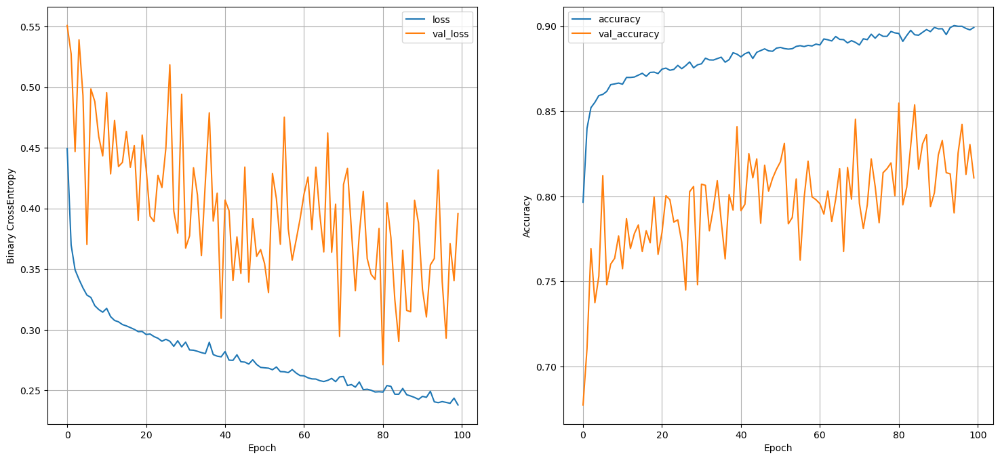

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8685 - loss: 0.3370
64 nodes 0 dropout 0.001 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7286 - loss: 0.5676 - val_accuracy: 0.6667 - val_loss: 0.5633
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8187 - loss: 0.3999 - val_accuracy: 0.7383 - val_loss: 0.4798
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8442 - loss: 0.3612 - val_accuracy: 0.7325 - val_loss: 0.5171
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8484 - loss: 0.3567 - val_accuracy: 0.7660 - val_loss: 0.4457
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8580 - loss: 0.3412 - val_accuracy: 0.7815 - val_loss: 0.4211
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8642 - loss: 0.3372 - val_accuracy: 0.7751 - val_loss: 0.4389
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8566 - loss: 0.3350 - val_accuracy: 0.7430 -

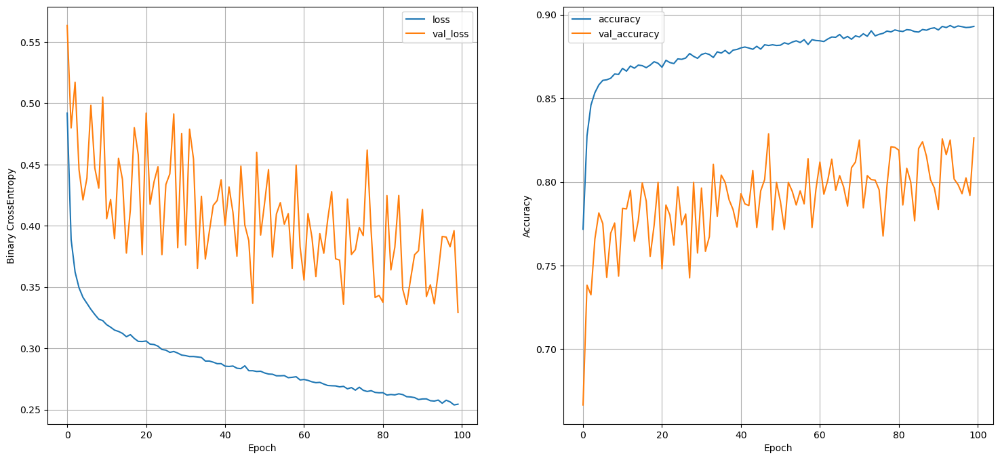

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8762 - loss: 0.3188
64 nodes 0.2 dropout 0.1 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7064 - loss: 0.6297 - val_accuracy: 0.9750 - val_loss: 0.6883
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6306 - loss: 0.6204 - val_accuracy: 0.1743 - val_loss: 0.6260
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6060 - loss: 0.6524 - val_accuracy: 0.0000e+00 - val_loss: 0.7886
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6388 - loss: 0.5859 - val_accuracy: 0.8291 - val_loss: 1.6622
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6501 - loss: 0.6042 - val_accuracy: 0.9240 - val_loss: 0.6756
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6238 - loss: 0.5853 - val_accuracy: 0.9473 - val_loss: 0.6607
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6283 - loss: 0.5871 - val_a

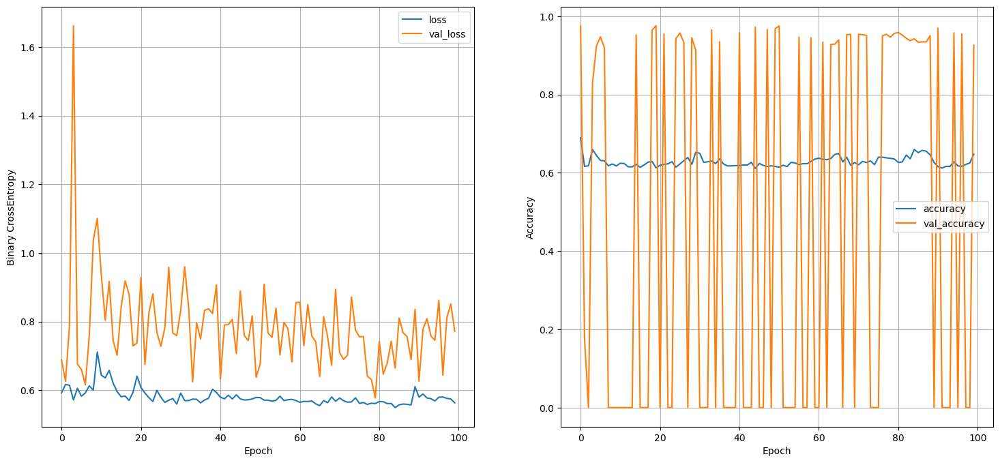

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7177 - loss: 0.5255
64 nodes 0.2 dropout 0.1 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7491 - loss: 0.5671 - val_accuracy: 0.5441 - val_loss: 0.6727
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7453 - loss: 0.5226 - val_accuracy: 0.4715 - val_loss: 0.5192
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7330 - loss: 0.5476 - val_accuracy: 0.3823 - val_loss: 0.6939
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7012 - loss: 0.5594 - val_accuracy: 0.0196 - val_loss: 0.7934
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6454 - loss: 0.5890 - val_accuracy: 0.9392 - val_loss: 0.6883
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6447 - loss: 0.5756 - val_accuracy: 0.0000e+00 - val_loss: 0.8949
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6363 - loss: 0.5648 - val_a

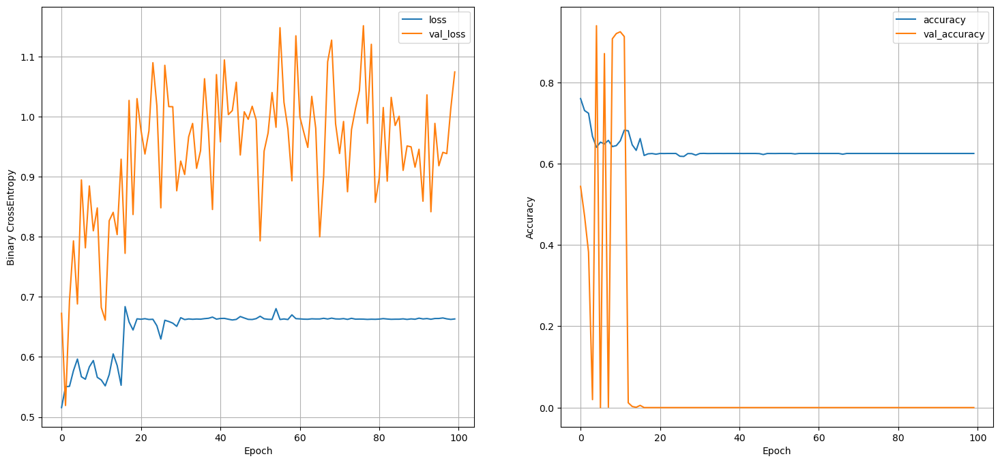

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6312 - loss: 0.6600
64 nodes 0.2 dropout 0.1 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7231 - loss: 0.6055 - val_accuracy: 0.8808 - val_loss: 0.4561
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7976 - loss: 0.4418 - val_accuracy: 0.5724 - val_loss: 0.6287
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8224 - loss: 0.4124 - val_accuracy: 0.5350 - val_loss: 0.6529
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8050 - loss: 0.4310 - val_accuracy: 0.5039 - val_loss: 0.5765
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7987 - loss: 0.4277 - val_accuracy: 0.3246 - val_loss: 0.7563
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7528 - loss: 0.4985 - val_accuracy: 0.8497 - val_loss: 0.6340
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7499 - loss: 0.4751 - val_accuracy: 0.5721 -

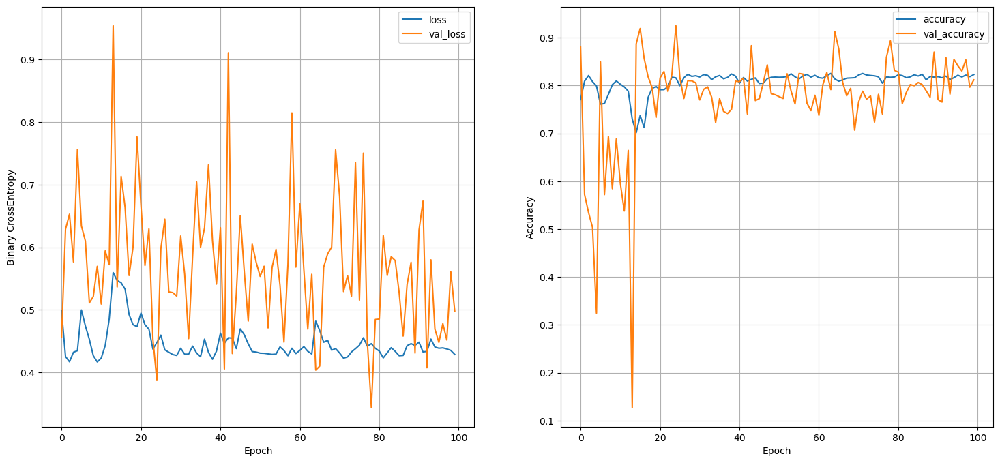

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8498 - loss: 0.3833
64 nodes 0.2 dropout 0.005 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.7810 - loss: 0.4637 - val_accuracy: 0.7808 - val_loss: 0.4589
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8430 - loss: 0.3653 - val_accuracy: 0.7143 - val_loss: 0.5158
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8535 - loss: 0.3525 - val_accuracy: 0.7548 - val_loss: 0.4361
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8476 - loss: 0.3487 - val_accuracy: 0.7622 - val_loss: 0.4416
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8561 - loss: 0.3389 - val_accuracy: 0.7356 - val_loss: 0.4699
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8591 - loss: 0.3343 - val_accuracy: 0.7291 - val_loss: 0.5305
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8656 - loss: 0.3230 - val_acc

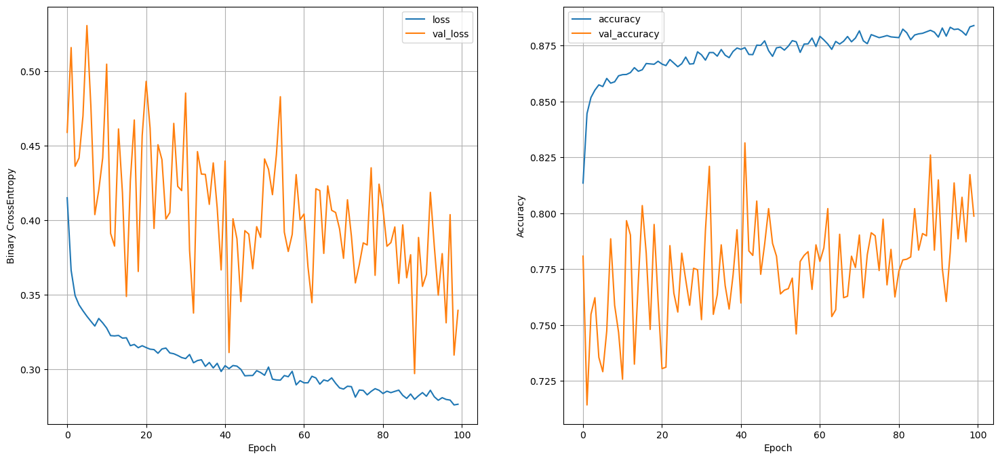

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8776 - loss: 0.3094
64 nodes 0.2 dropout 0.005 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7828 - loss: 0.4594 - val_accuracy: 0.7555 - val_loss: 0.4534
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8478 - loss: 0.3611 - val_accuracy: 0.7693 - val_loss: 0.4305
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8456 - loss: 0.3564 - val_accuracy: 0.6707 - val_loss: 0.5752
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8495 - loss: 0.3532 - val_accuracy: 0.7383 - val_loss: 0.4997
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8486 - loss: 0.3549 - val_accuracy: 0.7842 - val_loss: 0.4495
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8531 - loss: 0.3404 - val_accuracy: 0.7616 - val_loss: 0.4188
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8584 - loss: 0.3377 - val_acc

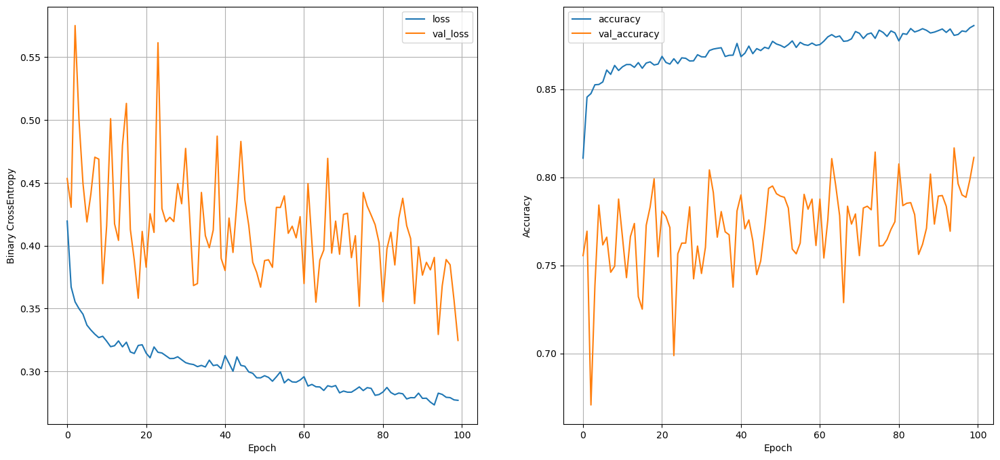

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8707 - loss: 0.3045
64 nodes 0.2 dropout 0.005 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7532 - loss: 0.4909 - val_accuracy: 0.6991 - val_loss: 0.5593
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8417 - loss: 0.3762 - val_accuracy: 0.7291 - val_loss: 0.5085
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8543 - loss: 0.3458 - val_accuracy: 0.6994 - val_loss: 0.5612
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8523 - loss: 0.3478 - val_accuracy: 0.7616 - val_loss: 0.4562
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8514 - loss: 0.3444 - val_accuracy: 0.7595 - val_loss: 0.4531
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8629 - loss: 0.3232 - val_accuracy: 0.7494 - val_loss: 0.4802
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8523 - loss: 0.3399 - val_accuracy: 0.7774

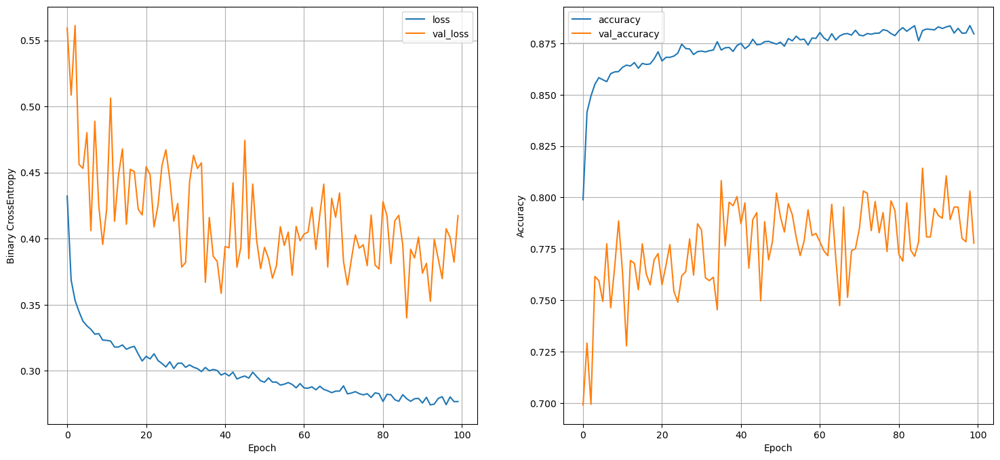

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8750 - loss: 0.3112
64 nodes 0.2 dropout 0.001 learning rate 32 batch size
Epoch 1/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7511 - loss: 0.5118 - val_accuracy: 0.7160 - val_loss: 0.5207
Epoch 2/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8260 - loss: 0.4002 - val_accuracy: 0.6950 - val_loss: 0.5836
Epoch 3/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8401 - loss: 0.3672 - val_accuracy: 0.7298 - val_loss: 0.5043
Epoch 4/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8381 - loss: 0.3675 - val_accuracy: 0.7487 - val_loss: 0.4924
Epoch 5/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8422 - loss: 0.3665 - val_accuracy: 0.7379 - val_loss: 0.5007
Epoch 6/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8500 - loss: 0.3559 - val_accuracy: 0.7437 - val_loss: 0.5088
Epoch 7/100
371/371 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8577 - loss: 0.3366 - val_acc

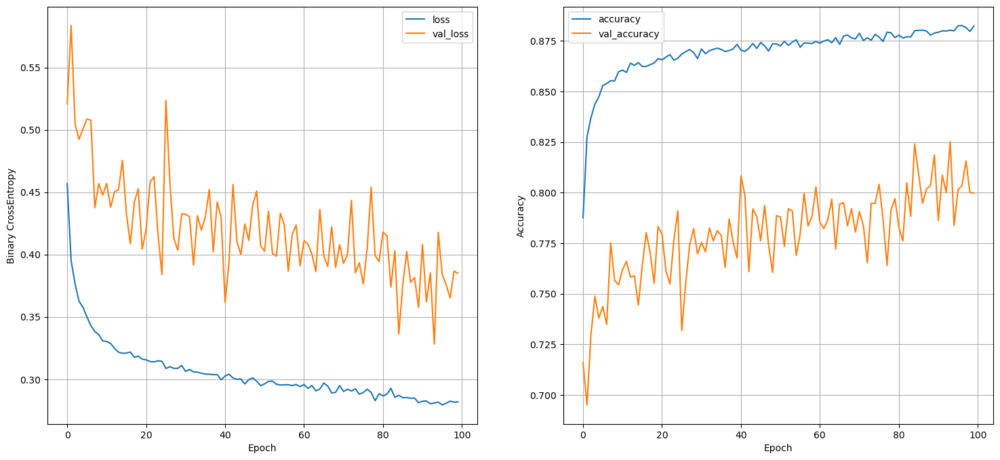

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8790 - loss: 0.3028
64 nodes 0.2 dropout 0.001 learning rate 64 batch size
Epoch 1/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7369 - loss: 0.5588 - val_accuracy: 0.6633 - val_loss: 0.5645
Epoch 2/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8159 - loss: 0.4078 - val_accuracy: 0.6967 - val_loss: 0.5244
Epoch 3/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8286 - loss: 0.3882 - val_accuracy: 0.7048 - val_loss: 0.5410
Epoch 4/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8373 - loss: 0.3817 - val_accuracy: 0.7129 - val_loss: 0.5656
Epoch 5/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8453 - loss: 0.3737 - val_accuracy: 0.7758 - val_loss: 0.4455
Epoch 6/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8429 - loss: 0.3634 - val_accuracy: 0.7433 - val_loss: 0.4981
Epoch 7/100
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8522 - loss: 0.3487 - val_acc

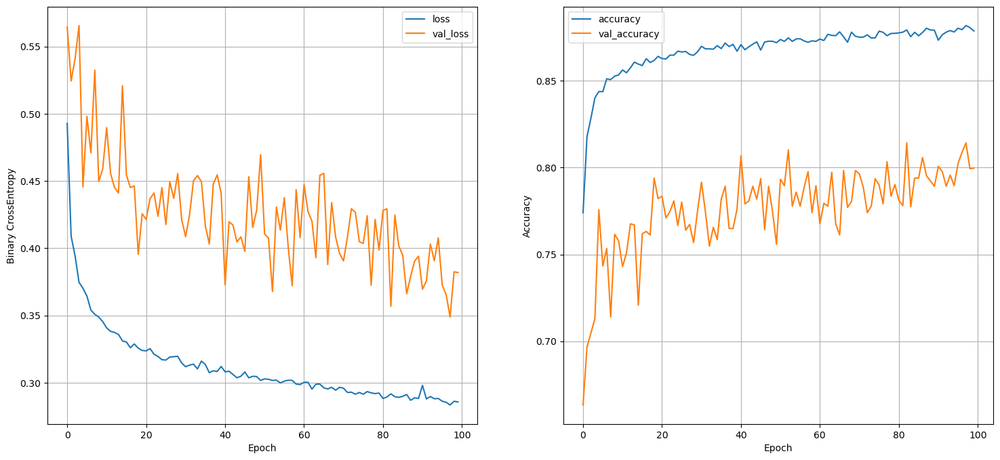

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8753 - loss: 0.3031
64 nodes 0.2 dropout 0.001 learning rate 128 batch size
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7124 - loss: 0.5748 - val_accuracy: 0.6562 - val_loss: 0.5948
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8029 - loss: 0.4193 - val_accuracy: 0.6825 - val_loss: 0.5500
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8251 - loss: 0.3966 - val_accuracy: 0.7112 - val_loss: 0.5281
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8354 - loss: 0.3790 - val_accuracy: 0.7420 - val_loss: 0.4886
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8371 - loss: 0.3774 - val_accuracy: 0.7582 - val_loss: 0.4756
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8467 - loss: 0.3608 - val_accuracy: 0.7626 - val_loss: 0.4616
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8418 - loss: 0.3639 - val_accuracy: 0.7700

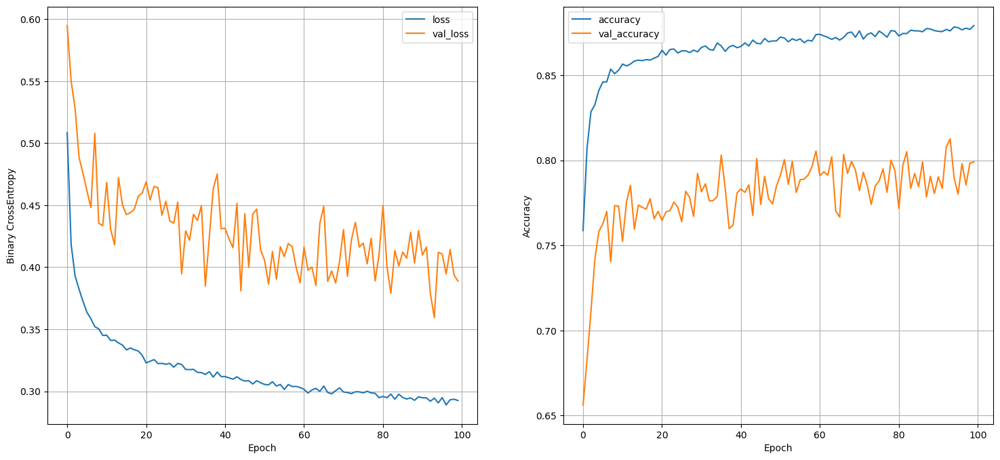

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8727 - loss: 0.3074


In [217]:
least_val_loss = float('inf')
least_loss_model = None
epochs = 100
for num_nodes in [16, 32, 64]:
    for dropout_prob in [0, 0.2]:
        for lr in [0.1, 0.005, 0.001]:
            for batch_size in [32, 64, 128]:
                print(f"{num_nodes} nodes {dropout_prob} dropout {lr} learning rate {batch_size} batch size")
                model, history = train_model(X_train=X_train, y_train=y_train, epochs=epochs, dropout_prob=dropout_prob, batch_size=batch_size, num_nodes=num_nodes, lr=lr)
                plot_history(history)
                val_loss = model.evaluate(X_valid, y_valid)[0]
                if val_loss < least_val_loss:
                    least_val_loss = val_loss
                    least_loss_model = model

In [219]:
model.evaluate(X_valid, y_valid)

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8727 - loss: 0.3074


[0.3035450577735901, 0.8774973750114441]

In [220]:
least_loss_model.evaluate(X_valid, y_valid)

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - accuracy: 0.8790 - loss: 0.3028


[0.2980228364467621, 0.8809148073196411]

In [221]:
least_val_loss

0.2980228364467621

In [226]:
y_pred = least_loss_model.predict(X_test)
y_pred = (y_pred > 0.5).astype('int').reshape(-1,)
y_pred

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


array([1, 1, 1, ..., 0, 1, 1])

In [227]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.77      0.81      1329
           1       0.88      0.93      0.90      2475

    accuracy                           0.87      3804
   macro avg       0.87      0.85      0.86      3804
weighted avg       0.87      0.87      0.87      3804



In [228]:
df.head()

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,1
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,1
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,1
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,1
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,1
